In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

In [2]:
gauge_df = pd.read_csv('gauge.csv', index_col=1)
gauge_df.drop('Year', axis=1, inplace=True)
gauge_df

,0,1,2,3,4,5,6,7,8,9,...,40,41,42,43,44,45,46,47,48,49
Week,,,,,,,,,,,,,,,,,,,,,
1,20.8,25.6,9.8,8.6,21.0,13.2,4.8,45.6,43.0,18.6,...,22.4,27.6,30.0,31.8,50.7,6.2,42.6,31.6,10.0,22.0
2,54.0,0.2,14.2,21.4,74.2,2.6,40.6,37.2,0.0,2.8,...,1.6,45.2,2.4,40.6,49.2,0.0,1.0,50.8,48.0,0.0
3,149.6,145.2,92.8,72.6,177.1,35.2,67.2,96.0,NaN,80.2,...,32.2,128.2,81.4,133.0,157.3,17.8,57.0,169.8,74.6,70.6
4,120.0,93.0,124.6,74.6,110.9,117.2,81.8,84.2,81.0,106.6,...,123.4,78.0,92.8,83.8,87.6,98.2,78.0,77.4,110.0,117.4
5,46.0,2.4,16.6,69.0,91.7,13.8,67.8,86.6,4.6,17.4,...,7.6,54.0,23.0,78.4,98.3,11.4,32.6,37.0,78.6,9.6
6,62.0,12.2,35.0,63.8,40.6,51.6,36.2,23.4,28.6,110.2,...,58.4,30.0,NaN,NaN,41.0,18.4,27.8,51.2,83.6,7.8
7,23.6,8.2,20.0,14.8,23.8,9.2,19.0,10.2,19.0,7.8,...,20.6,10.0,NaN,NaN,12.2,2.4,12.2,11.8,28.2,7.2
8,59.4,NaN,41.6,57.8,48.2,38.8,34.8,70.2,114.8,17.4,...,65.6,63.2,NaN,75.4,64.4,23.4,95.4,52.0,39.0,33.2
9,57.2,NaN,52.4,68.0,66.8,99.6,51.4,85.0,97.2,47.6,...,79.2,101.4,NaN,54.4,51.9,93.6,67.4,70.2,64.6,37.4


In [3]:
weeks = ['13', '15', '16', '17', '18',
'19', '20', '21', '22', '23',
'24', '26', '28', '29', '31',
'32', '33', '35', '36', '37',
'38', '39', '41', '44', '45',
'46', '47', '48', '49', '50',
'51']
weeksint = list(map(int, weeks))

In [4]:
radars = pd.read_csv('radars_withoutzero.csv', index_col=('lat', 'long'))
radars.head(n=10)

13         15         16         17         18         19  \
lat long                                                                     
0   0     72.294636  45.855110  11.555313  58.455189  13.455605  12.315153   
    1     66.840412  48.700857  10.447831  70.463169  14.657457   8.156273   
    2     83.611426  47.329886  10.981148  56.940418  13.143666   9.930907   
    3     85.075782  56.994606  12.083639  54.885893  11.120173  21.864765   
    4     84.071118  58.285694  12.180566  45.201168  11.000099  21.605478   
    5     81.000618  62.580485  12.906918  63.381817  10.189529  14.932759   
    6     75.050963  47.807548  13.853209  45.000145  11.312839  18.564631   
    7     69.622593  36.806604  15.173553  44.059012   6.999031  24.044255   
    8     75.415726  44.439799  21.221386  41.478677   8.522376  20.535150   
    9     80.799770  38.762127  14.196516  42.314822  10.112614  22.923202   

                 20         21        22         23    ...           39  \
lat long                                               ...                
0   0     22.446733  33.734686  4.518157  29.707207    ...     3.454643   
    1     27.562347  37.508739  4.528953  28.870022    ...     3.425111   
    2     33.860542  39.010331  5.404231  36.114737    ...     2.507637   
    3     38.093529  43.022287  6.687292  31.489770    ...     2.968954   
    4     39.206432  43.331180  6.727096  30.539226    ...     2.857295   
    5     26.669373  38.914828  5.673334  35.596037    ...     2.914037   
    6     33.853437  41.436309  5.093495  21.394368    ...     3.529375   
    7     30.299419  33.371672  5.920663  24.174678    ...     2.417975   
    8     36.984285  33.036344  6.848641  19.191810    ...     2.663142   
    9     39.875694  30.630790  7.171367  16.993073    ...     3.568752   

                 41         44         45         46         47         48  \
lat long                                                                     
0   0     27.415225  24.765249  74.342486  58.404235  21.351817  20.594985   
    1     27.389223  36.585670  73.170429  58.305703  23.131464  18.431464   
    2     26.342005  26.940263  72.568766  54.546573  17.527366  20.200261   
    3     30.875726  27.699918  84.671733  59.378169  16.759426  21.481097   
    4     31.569345  36.670290  87.311255  63.802085  17.443937  22.660412   
    5     26.542776  27.299325  82.120231  59.683283  13.898443  22.387424   
    6     29.983836  27.044286  83.765618  65.893522  14.757252  25.541144   
    7     31.005859  22.941232  89.237978  63.075915  12.790094  22.865527   
    8     27.983706  32.419345  96.345365  67.570239  10.169690  23.968217   
    9     26.059206  29.121352  99.639398  62.568772  13.347432  30.898068   

                 49         50        51  
lat long                                  
0   0     27.730778  23.828046  2.647047  
    1     26.798295  26.875146  3.281278  
    2     28.595661  41.048792  2.690293  
    3     31.845850  42.256502  2.423741  
    4     33.322246  44.921599  2.349027  
    5     32.407635  33.299733  2.783190  
    6     39.933174  33.838313  2.784754  
    7     31.439534  24.647667  3.267726  
    8     32.906297  27.838460  2.526362  
    9     33.515732  23.999644  2.346348  

[10 rows x 31 columns]

In [5]:
radars.as_matrix()

array([[72.29463559, 45.85510988, 11.55531293, ..., 27.73077842,
        23.82804566,  2.64704728],
       [66.84041188, 48.70085654, 10.44783132, ..., 26.79829519,
        26.87514552,  3.28127822],
       [83.611426  , 47.32988626, 10.98114837, ..., 28.59566132,
        41.04879177,  2.69029312],
       ...,
       [18.87338421, 27.70918519, 34.79874871, ...,  4.85541479,
        46.7983737 ,  1.93377499],
       [20.41106685, 28.51925955, 36.8096381 , ...,  4.83251819,
        45.83684308,  2.23887639],
       [19.29473613, 25.96905287, 37.41349062, ...,  4.62018384,
        48.05801833,  2.00972925]])

In [15]:
radars = []
for week in weeks:
#     try:
        print len((np.load('send2/wk{}.npy'.format(week))).flatten())
        radars.append((np.load('send2/wk{}.npy'.format(week))).flatten())
#     except:
#         radars.append((np.zeros((480*480)).fill(np.nan)))
print(len(radars))
radars = np.transpose(radars)

230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
230400
31


In [16]:
stations_dict={0: (222, 248), 1: (123, 249), 2: (218, 255), 3: (238, 252), 4: (214, 237), 5: (159, 245), 6: (245, 231), 7: (202, 214), 8: None, 9: (190, 257), 10: (130, 274), 11: (183, 254), 12: (217, 218), 13: (201, 257), 14: None, 15: (167, 244), 16: (210, 254), 17: (187, 208), 18: None, 19: (186, 230), 20: (146, 229), 21: (178, 230), 22: (202, 234), 23: (234, 232), 24: (161, 226), 25: (180, 241), 26: (135, 229), 27: (183, 250), 28: (169, 260), 29: (201, 243), 30: (198, 249), 31: (143, 238), 32: (171, 263), 33: (141, 254), 34: (209, 242), 35: (227, 224), 36: (193, 257), 37: (149, 227), 38: (231, 240), 39: None, 40: (202, 265), 41: (194, 228), 42: (138, 205), 43: (185, 213), 44: None, 45: (158, 264), 46: (106, 259), 47: (188, 241), 48: (239, 213), 49: (163, 299)}

107749
(229, 224)
107749
107749
(229, 224)
d


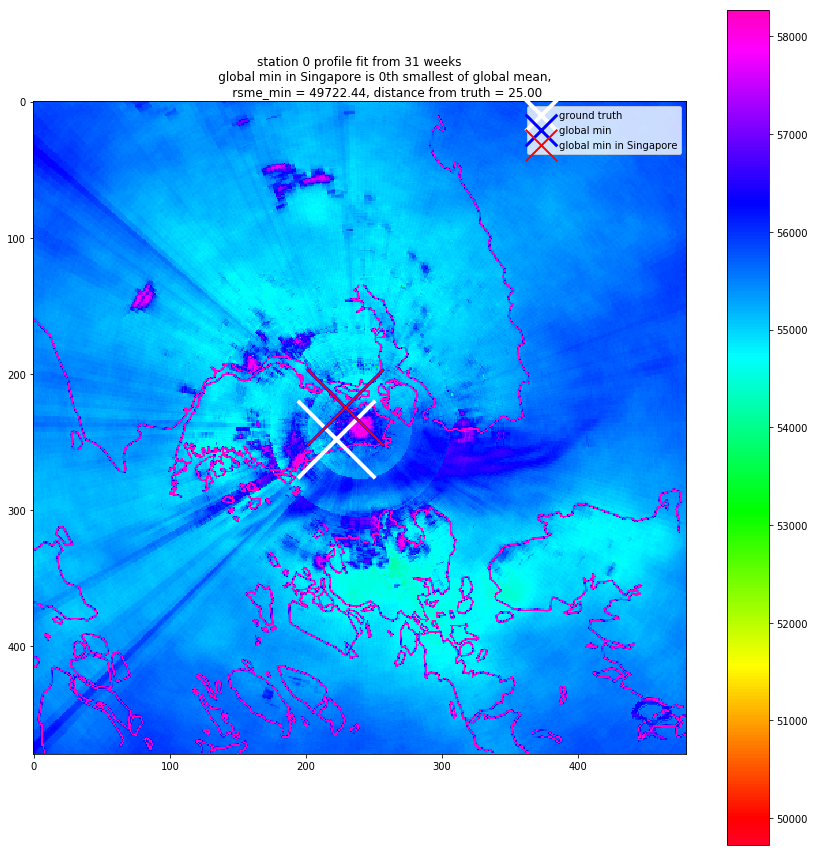

(0, 229, 224, 49722.441929474124, 25.0, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


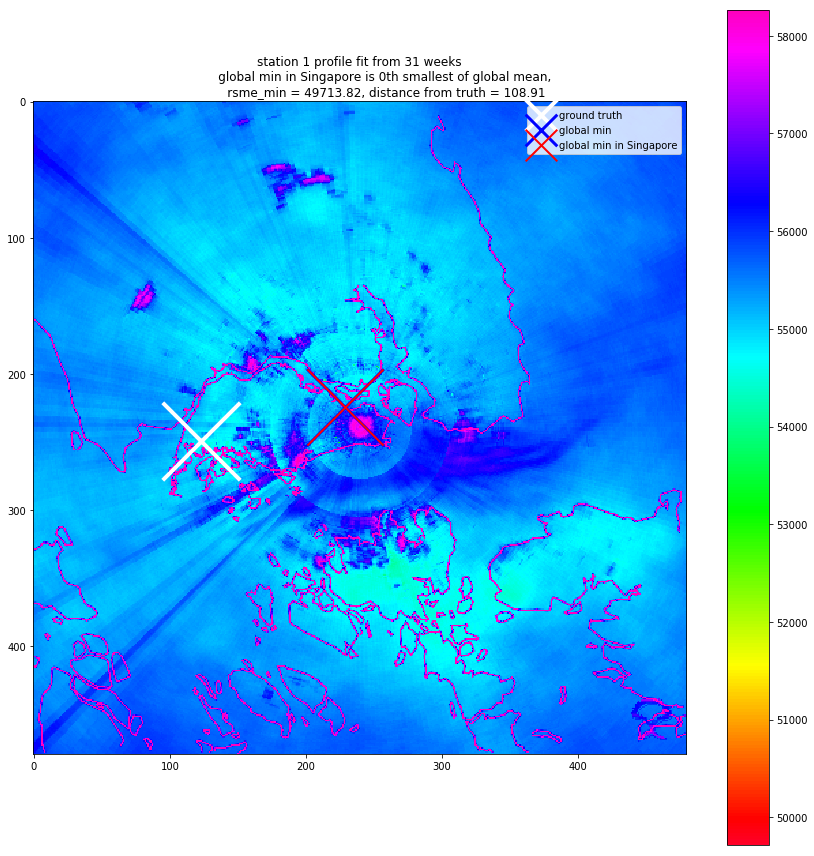

(1, 229, 224, 49713.817900863934, 108.90821823902914, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


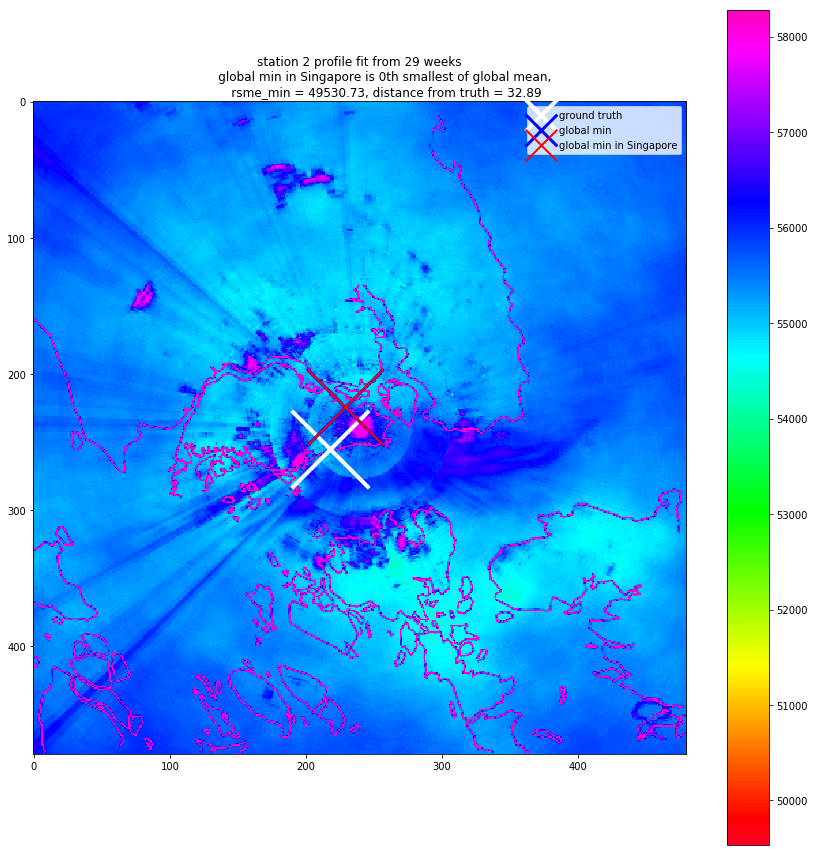

(2, 229, 224, 49530.72527995849, 32.89376840679705, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


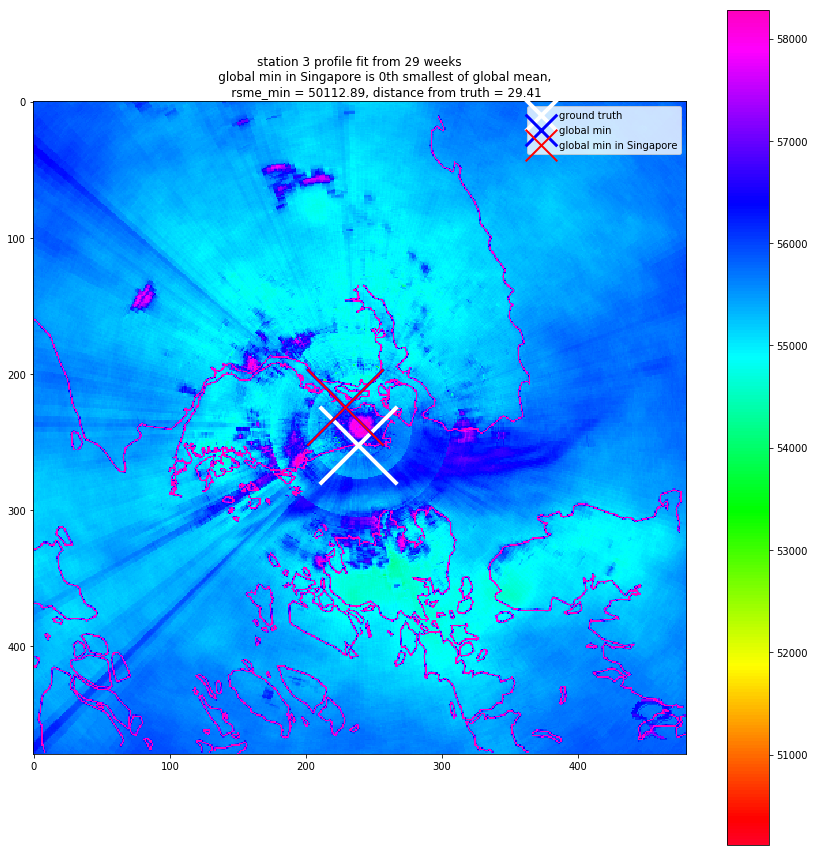

(3, 229, 224, 50112.8948039549, 29.410882339705484, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


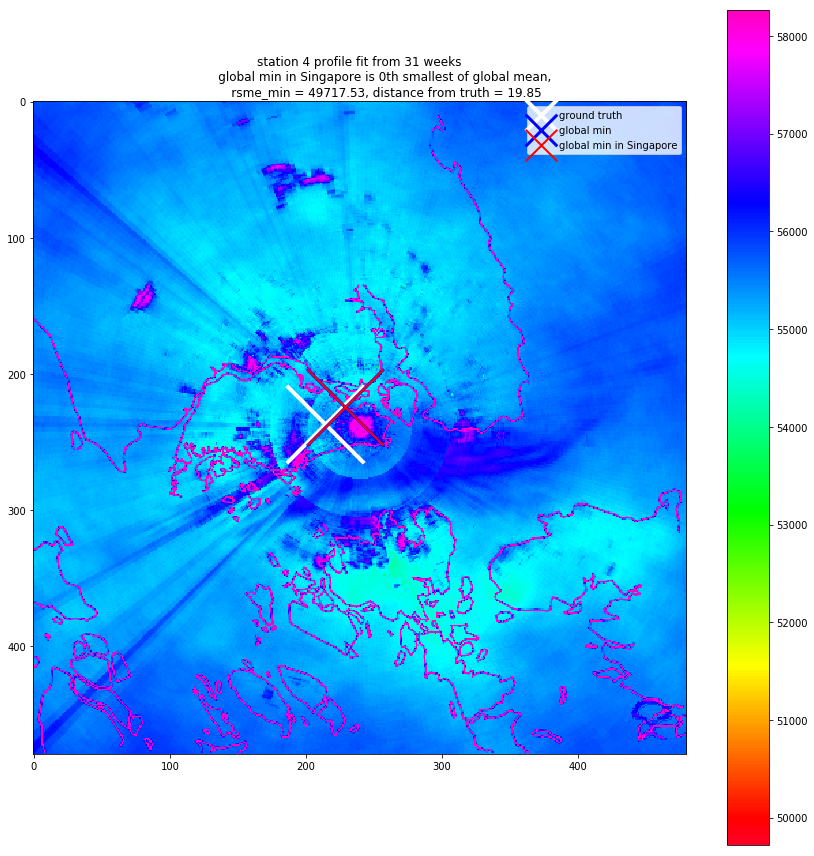

(4, 229, 224, 49717.52736540795, 19.849433241279208, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


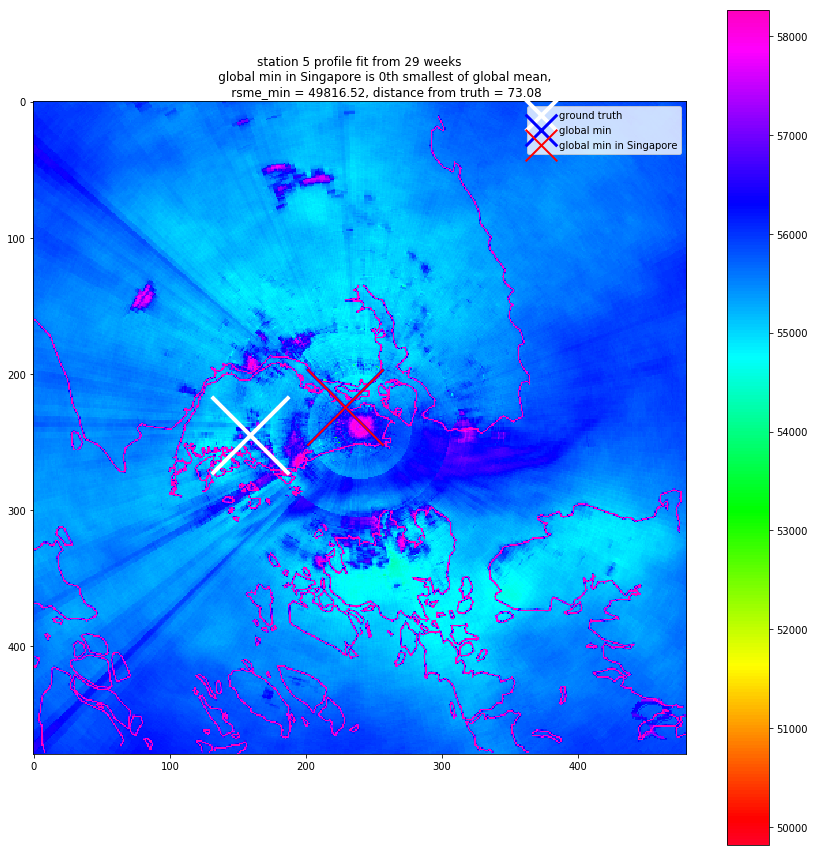

(5, 229, 224, 49816.519613546414, 73.08214556237385, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


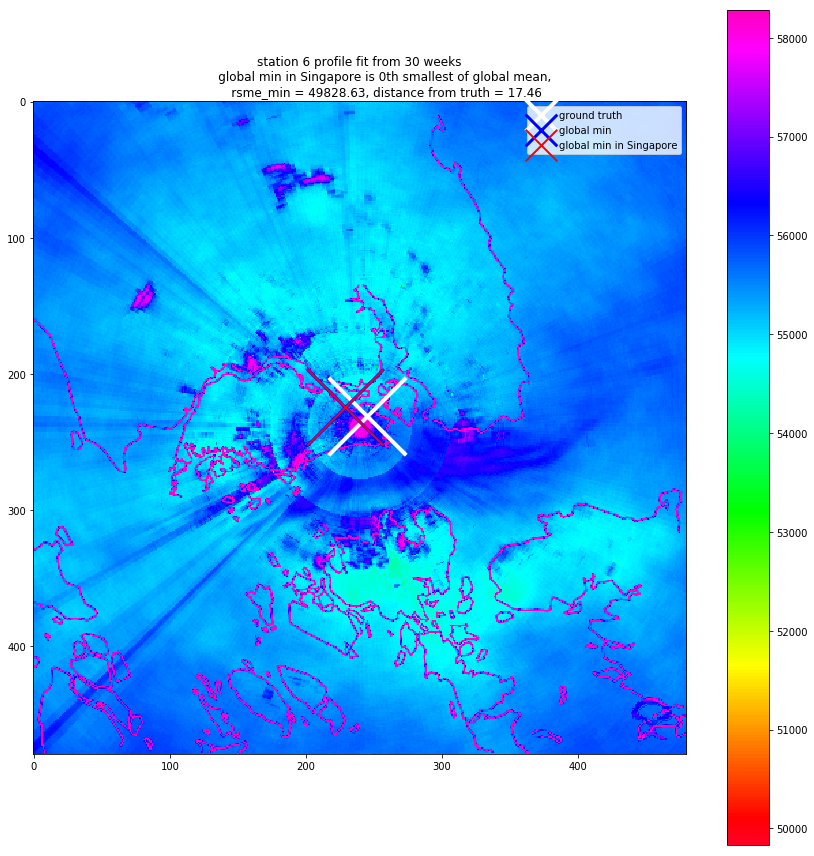

(6, 229, 224, 49828.63335853527, 17.46424919657298, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


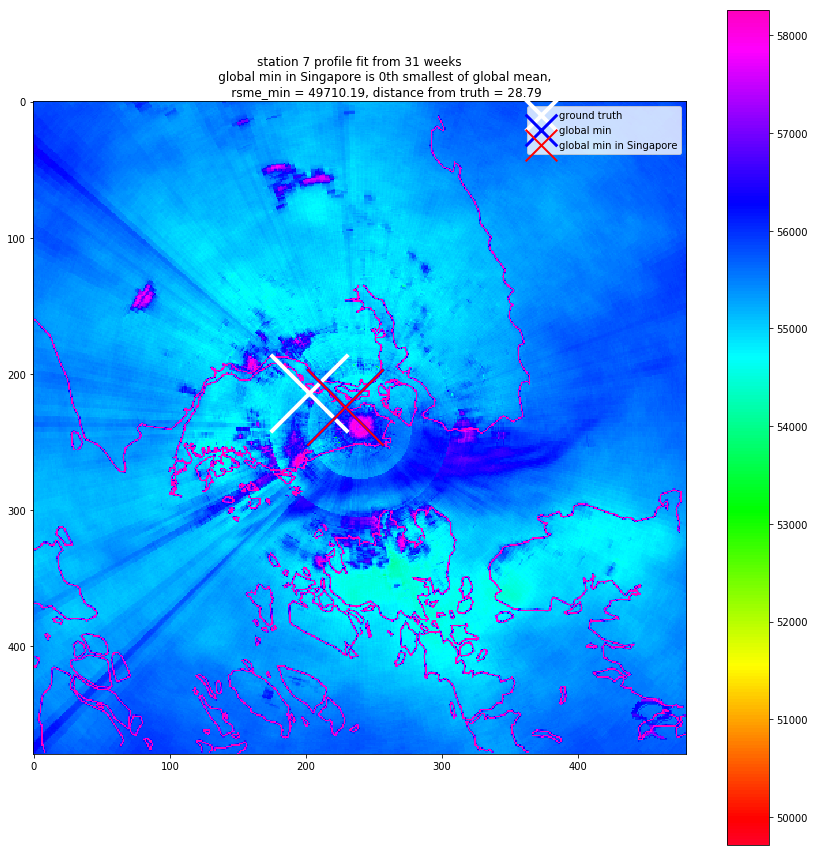

(7, 229, 224, 49710.185548093716, 28.792360097775937, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


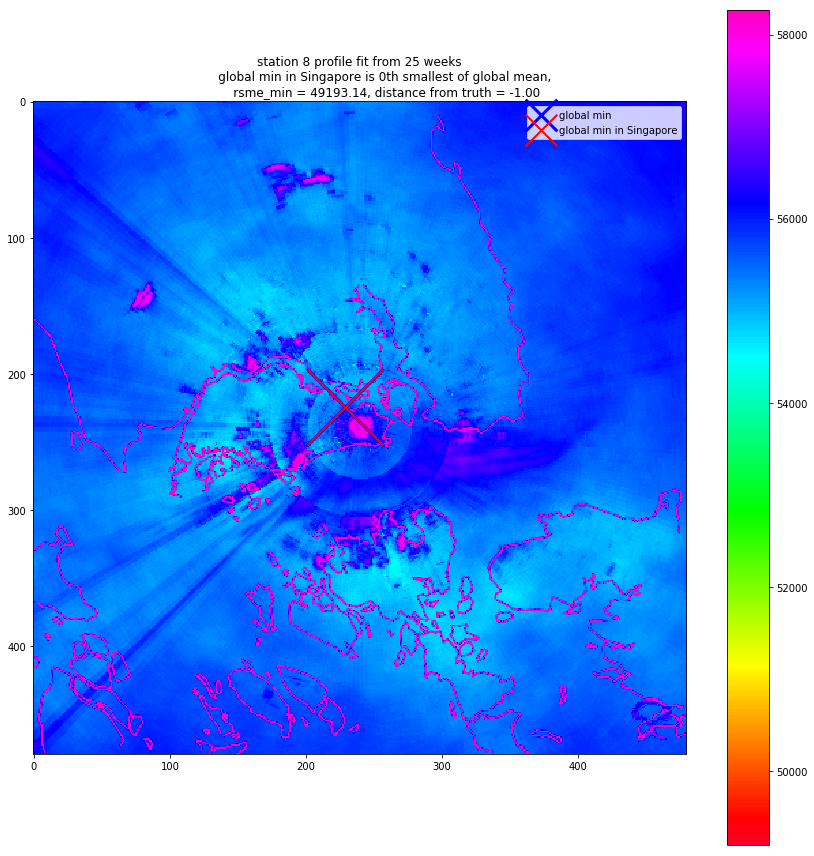

(8, 229, 224, 49193.14317124182, None, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


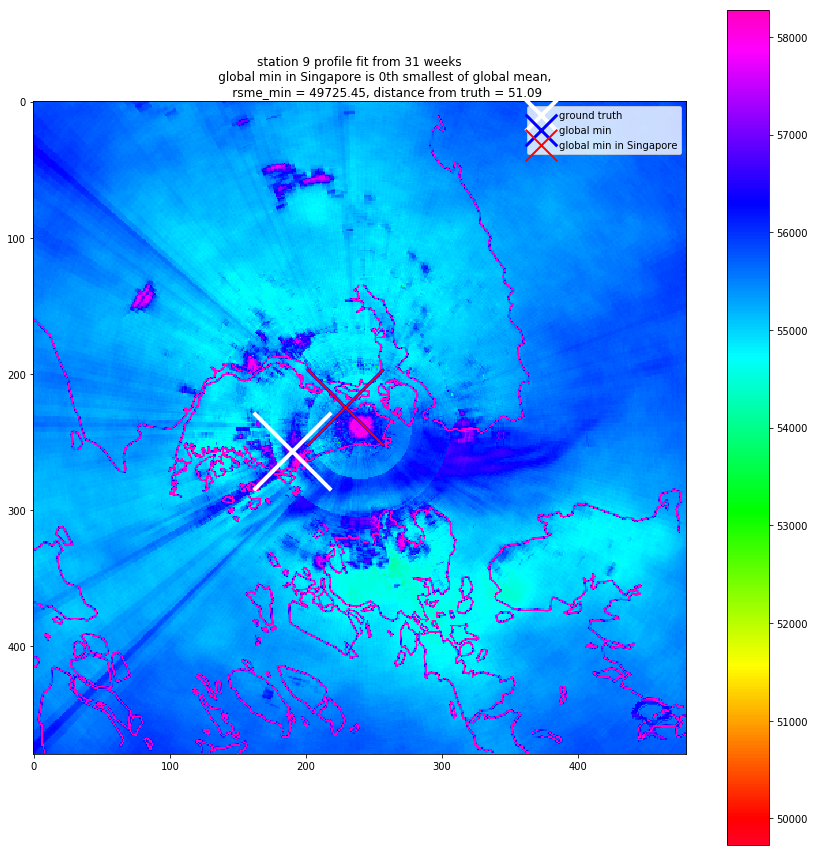

(9, 229, 224, 49725.447231743354, 51.088159097779204, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


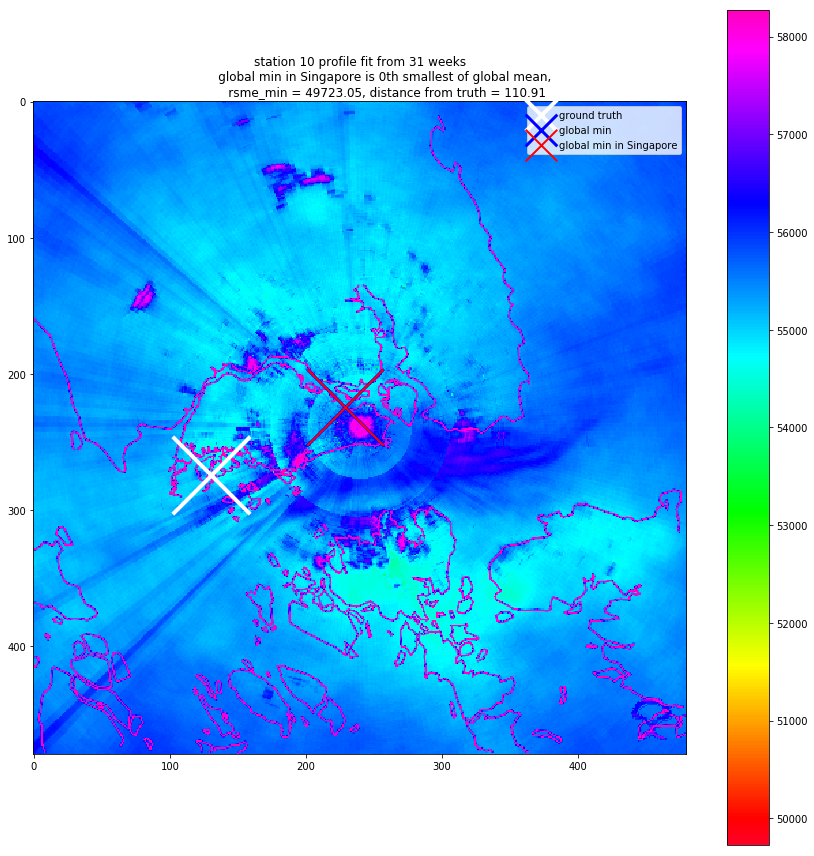

(10, 229, 224, 49723.05259028975, 110.90987332063814, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


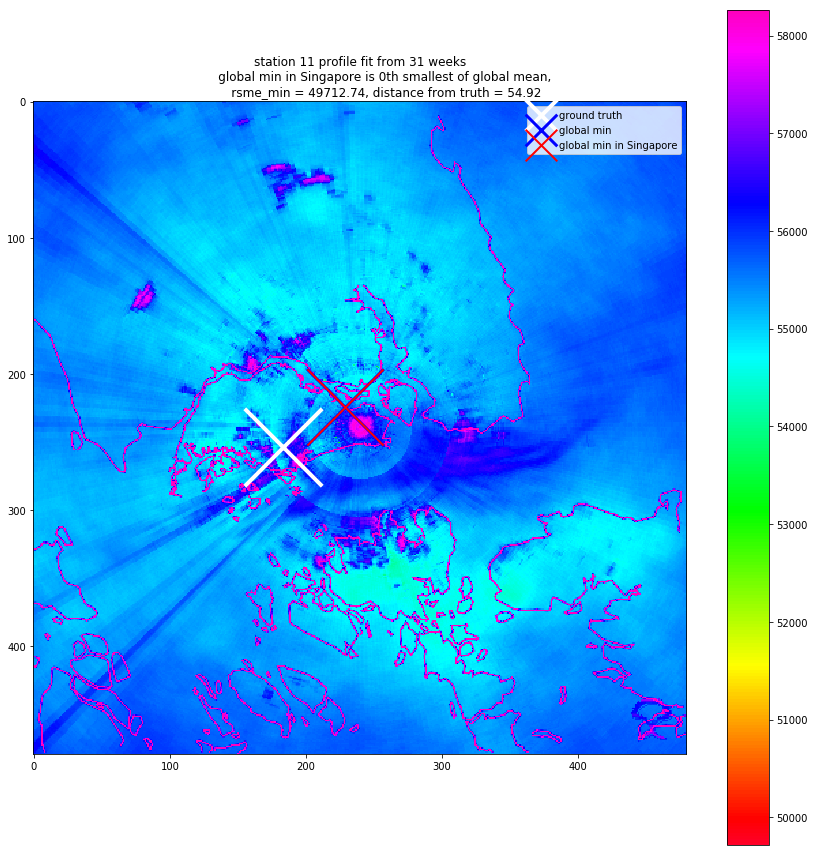

(11, 229, 224, 49712.736303124264, 54.91812087098393, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


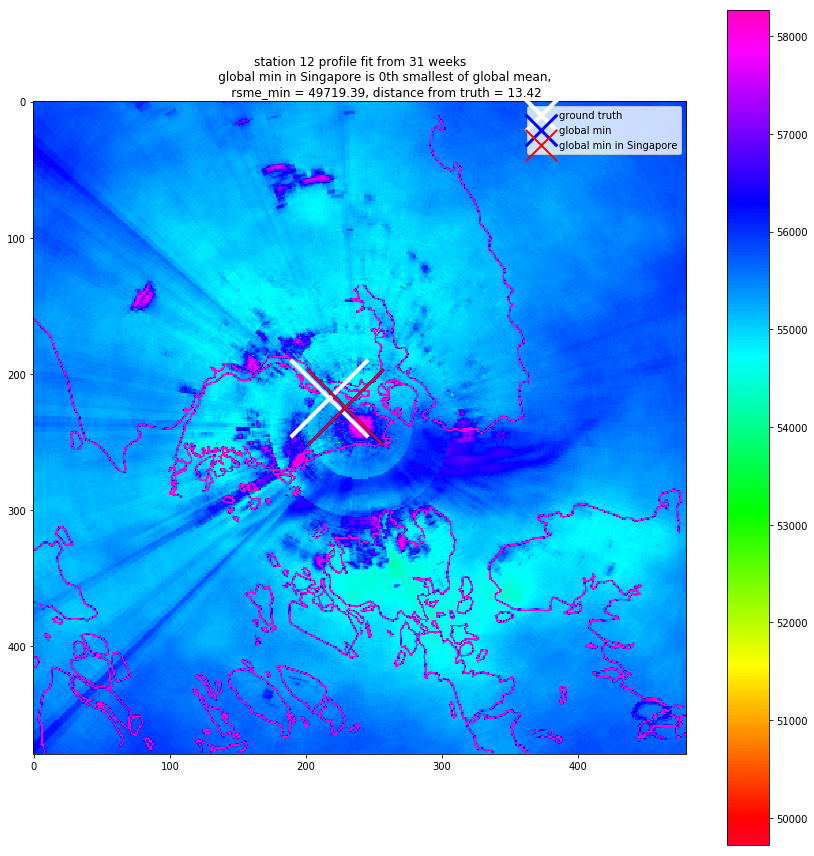

(12, 229, 224, 49719.39221136911, 13.416407864998739, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


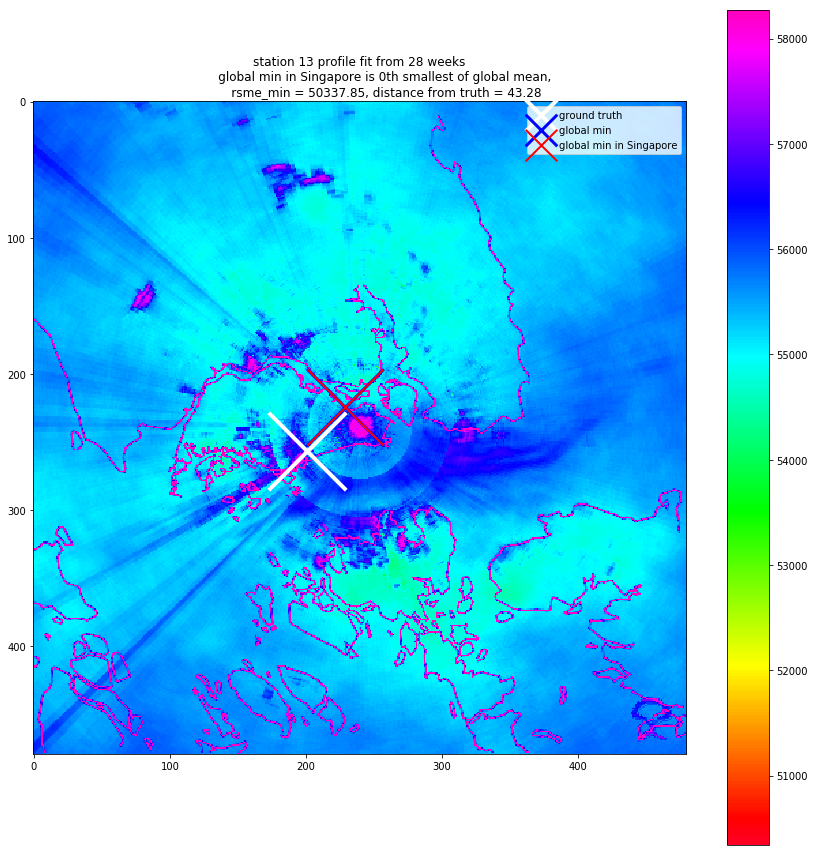

(13, 229, 224, 50337.84962369043, 43.278170016764804, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


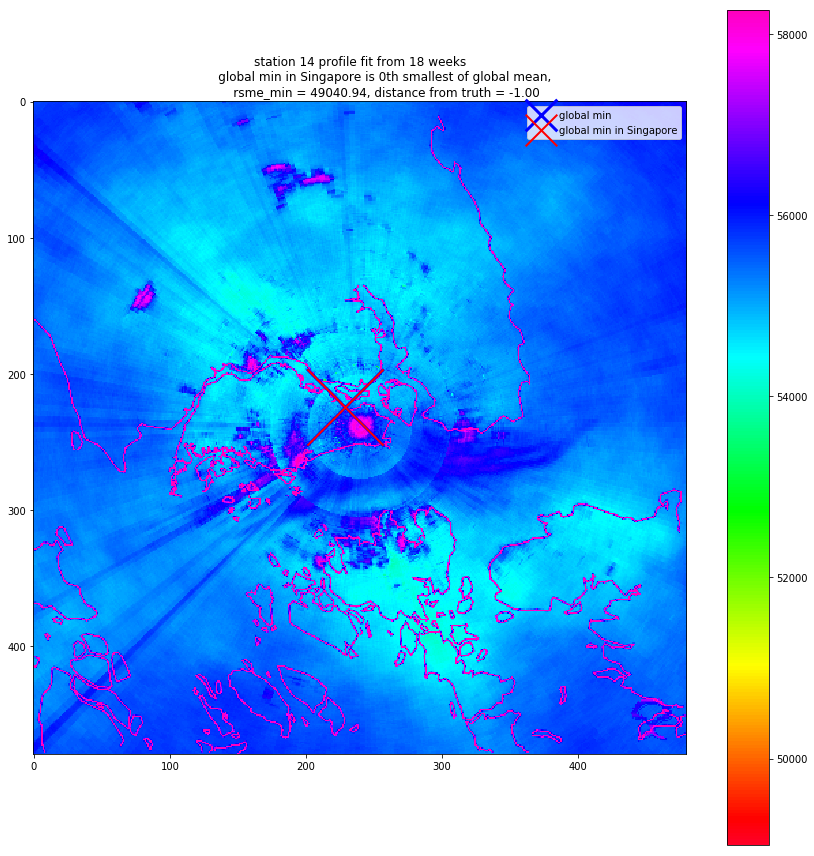

(14, 229, 224, 49040.942069350676, None, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


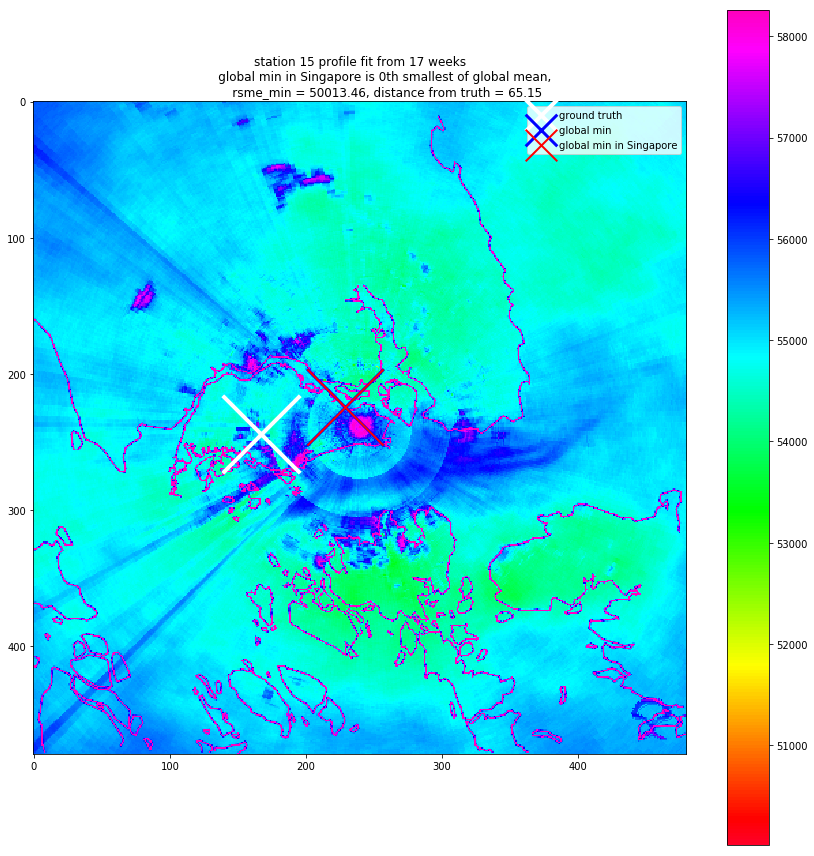

(15, 229, 224, 50013.45766574924, 65.14598989960932, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


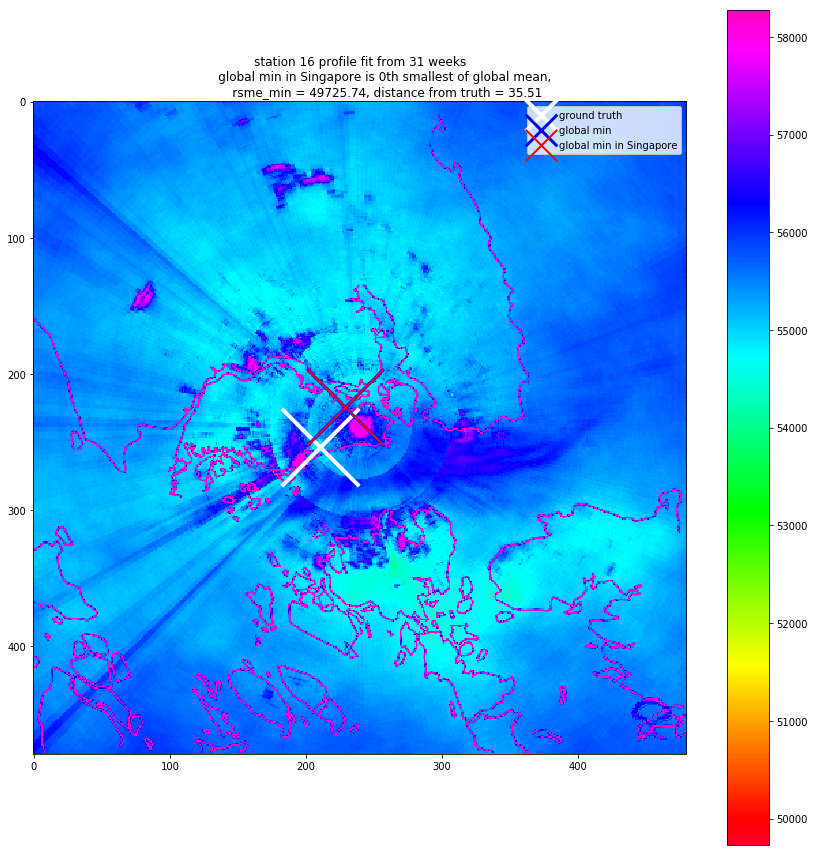

(16, 229, 224, 49725.74176385995, 35.510561809129406, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


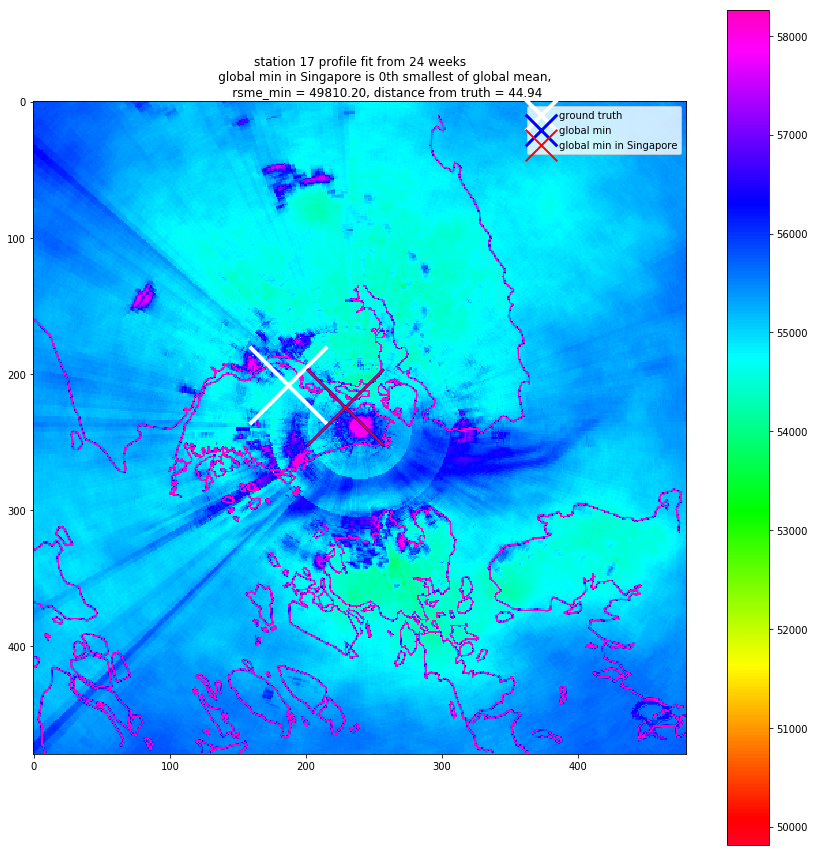

(17, 229, 224, 49810.20007383074, 44.94441010848846, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


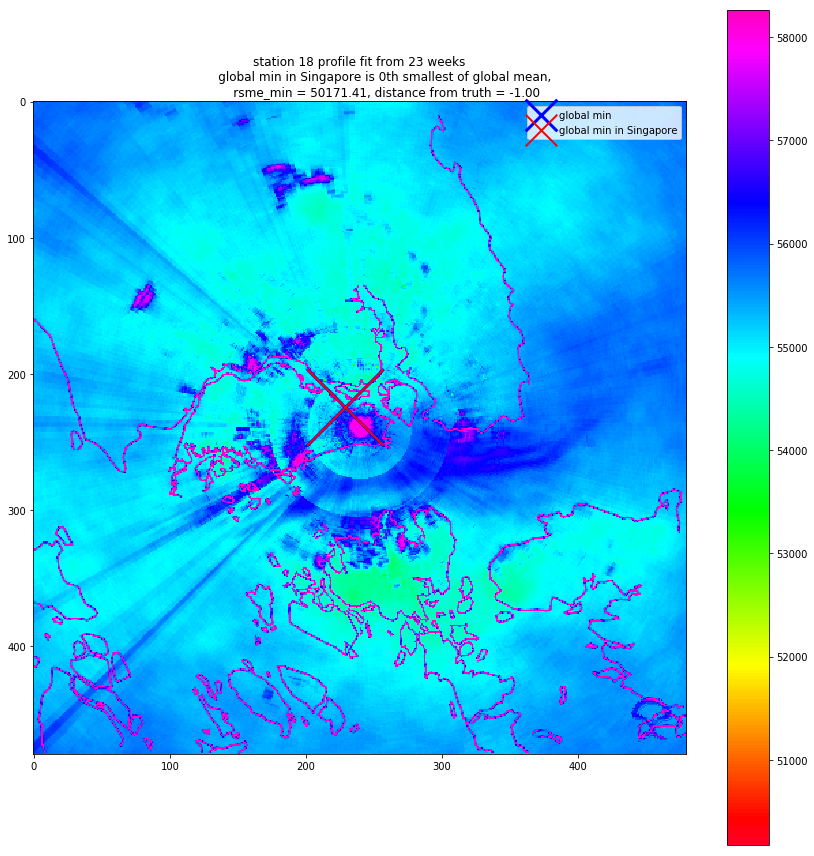

(18, 229, 224, 50171.4055418653, None, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


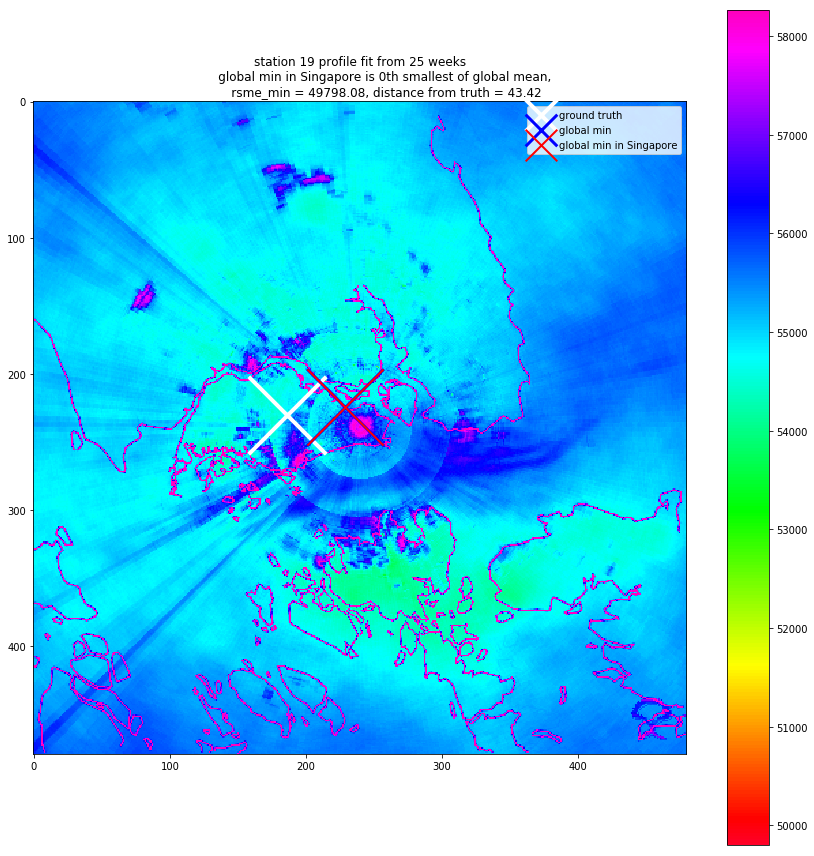

(19, 229, 224, 49798.082038146524, 43.41658669218482, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


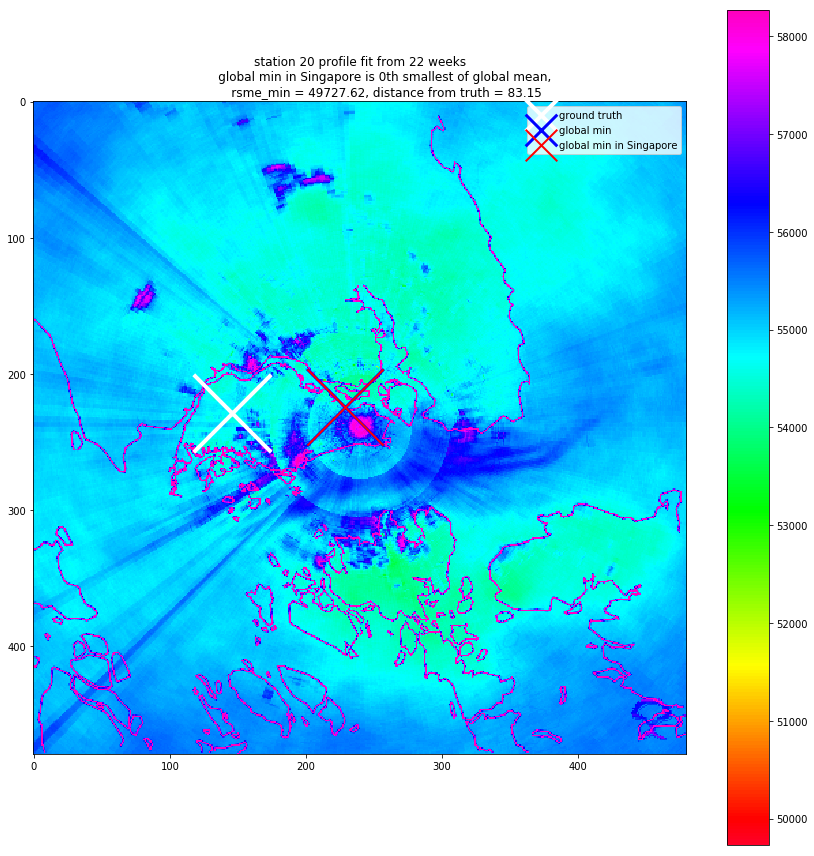

(20, 229, 224, 49727.61585044087, 83.15046602394962, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


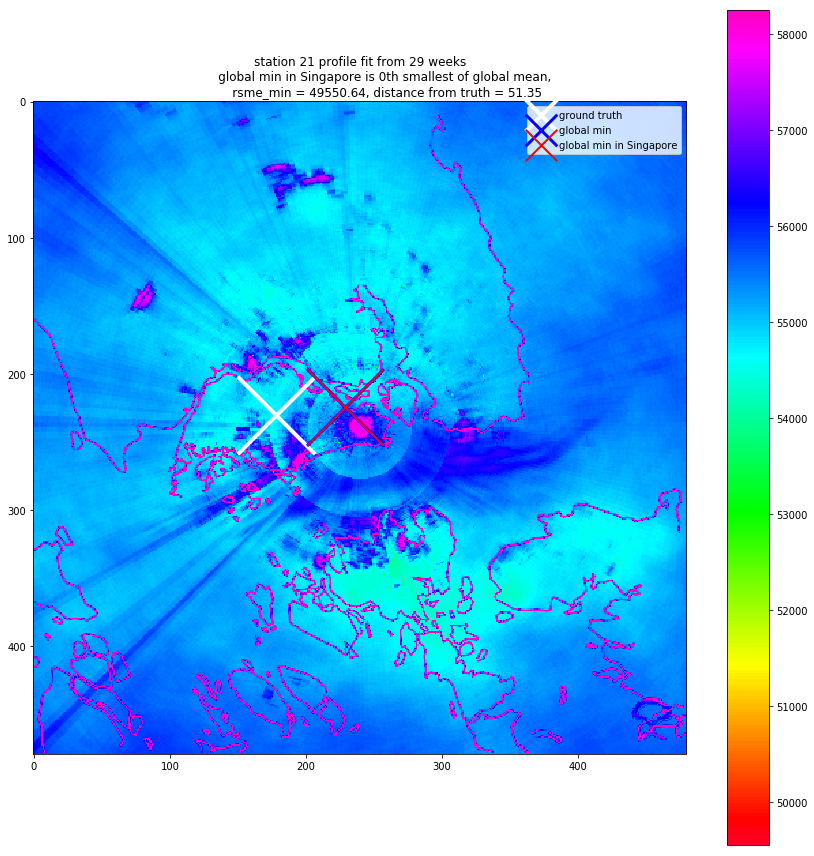

(21, 229, 224, 49550.63602860698, 51.35172830587107, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


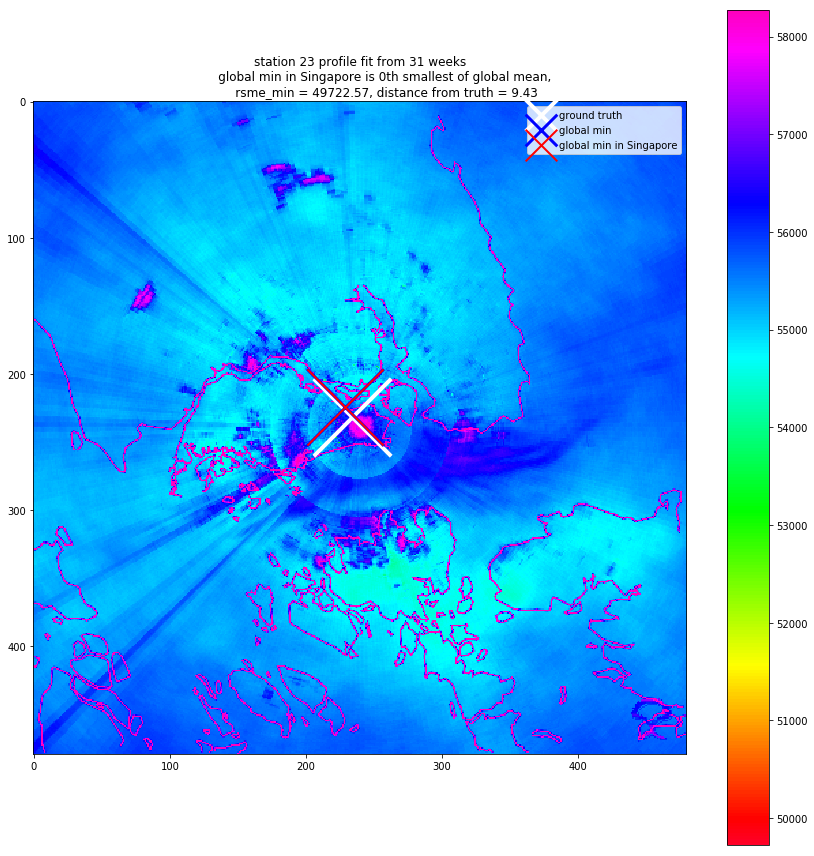

(23, 229, 224, 49722.569522272635, 9.433981132056603, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


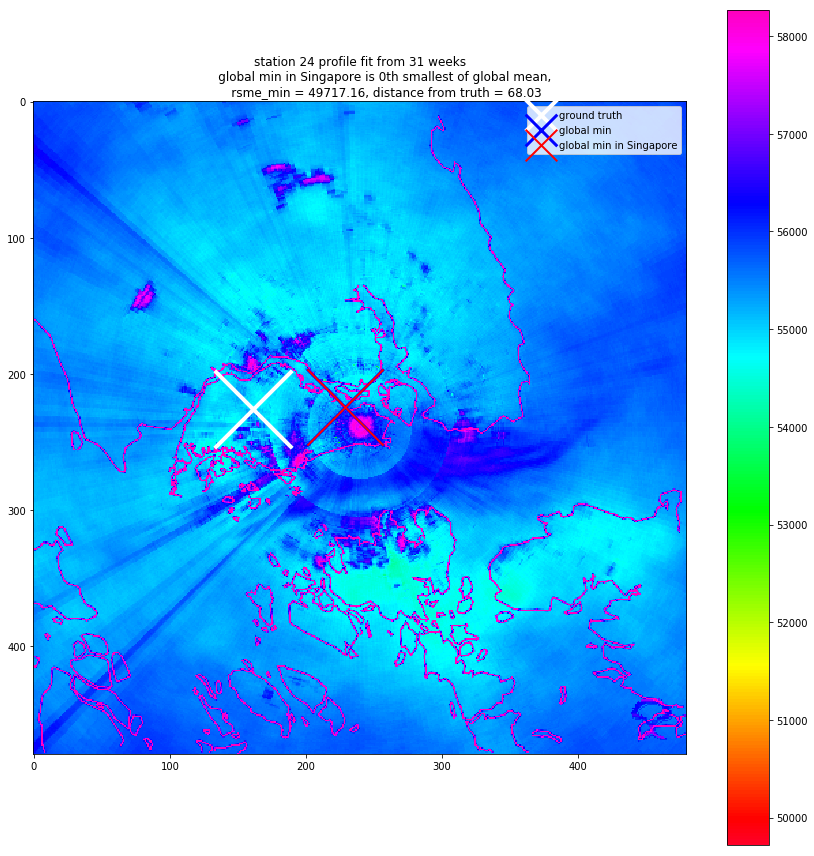

(24, 229, 224, 49717.16024589726, 68.0294054067798, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


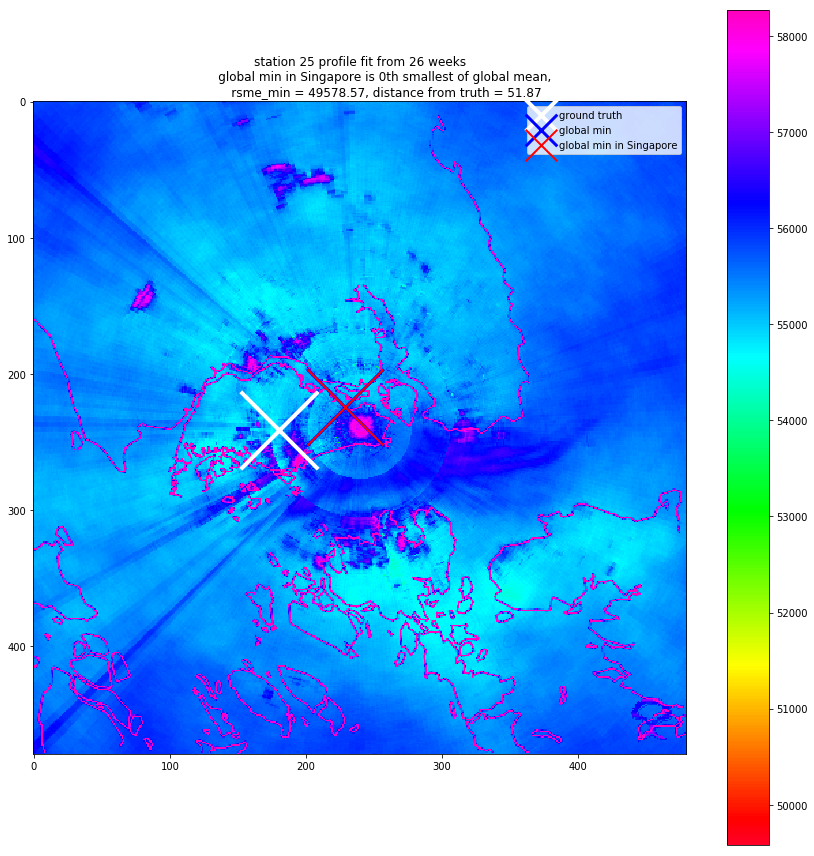

(25, 229, 224, 49578.5746755324, 51.86520991955976, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


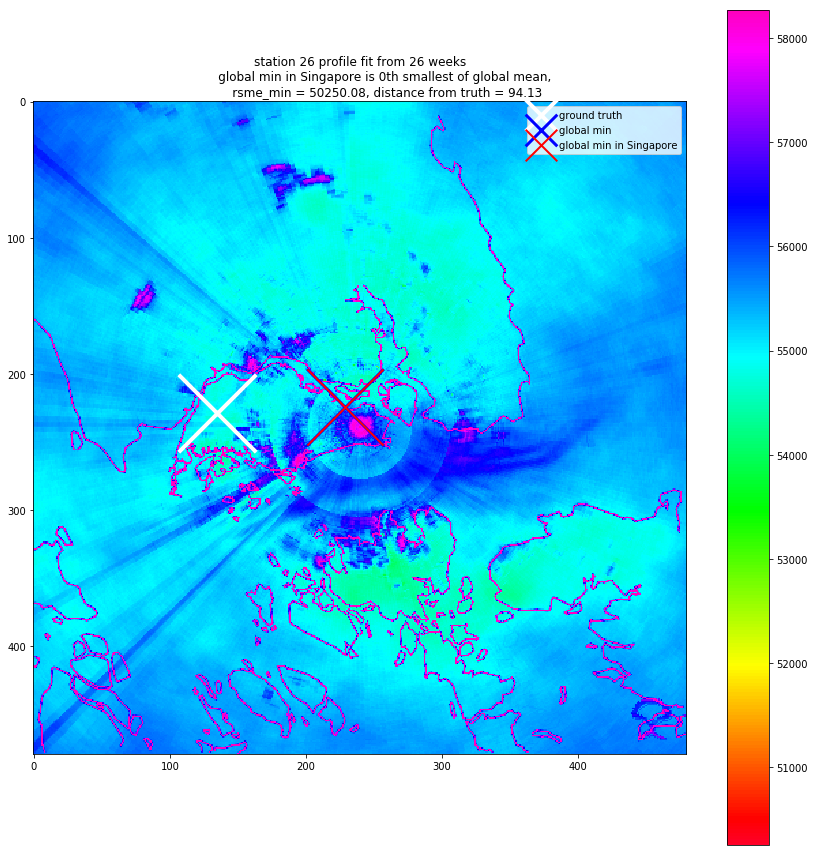

(26, 229, 224, 50250.0779667915, 94.13288479590966, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


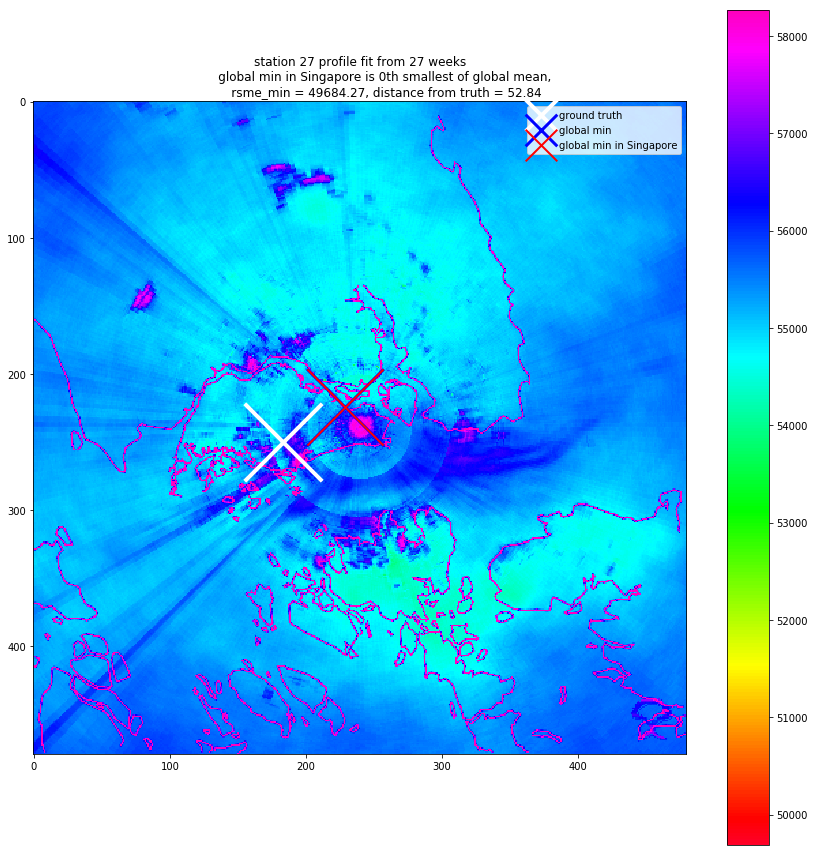

(27, 229, 224, 49684.267334521355, 52.839379254491625, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


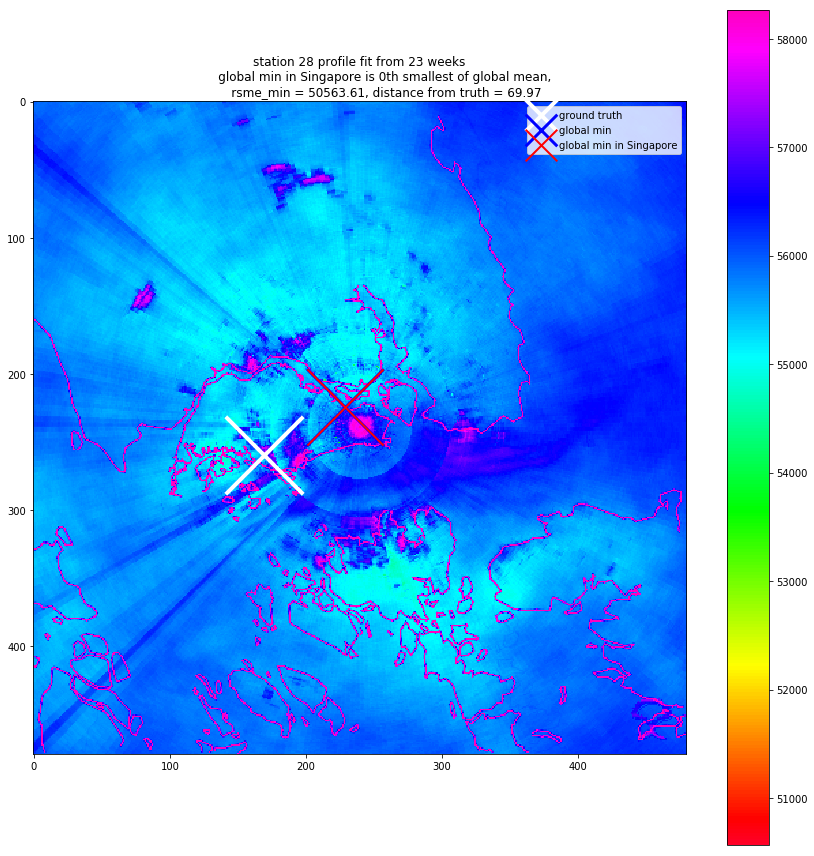

(28, 229, 224, 50563.60809254259, 69.9714227381436, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


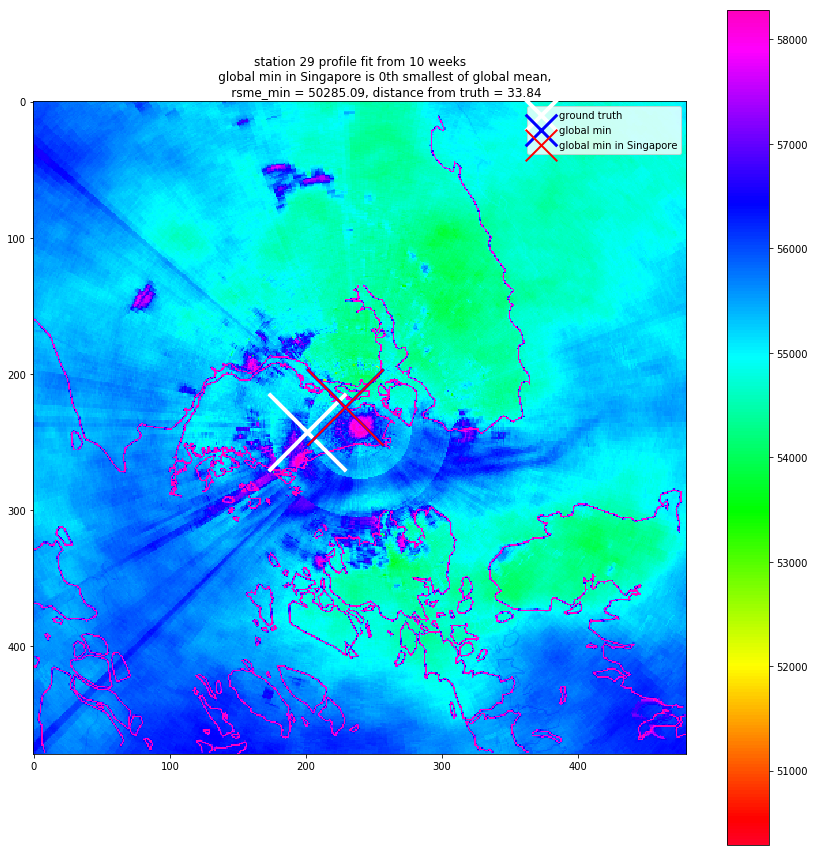

(29, 229, 224, 50285.09302134085, 33.83784863137726, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


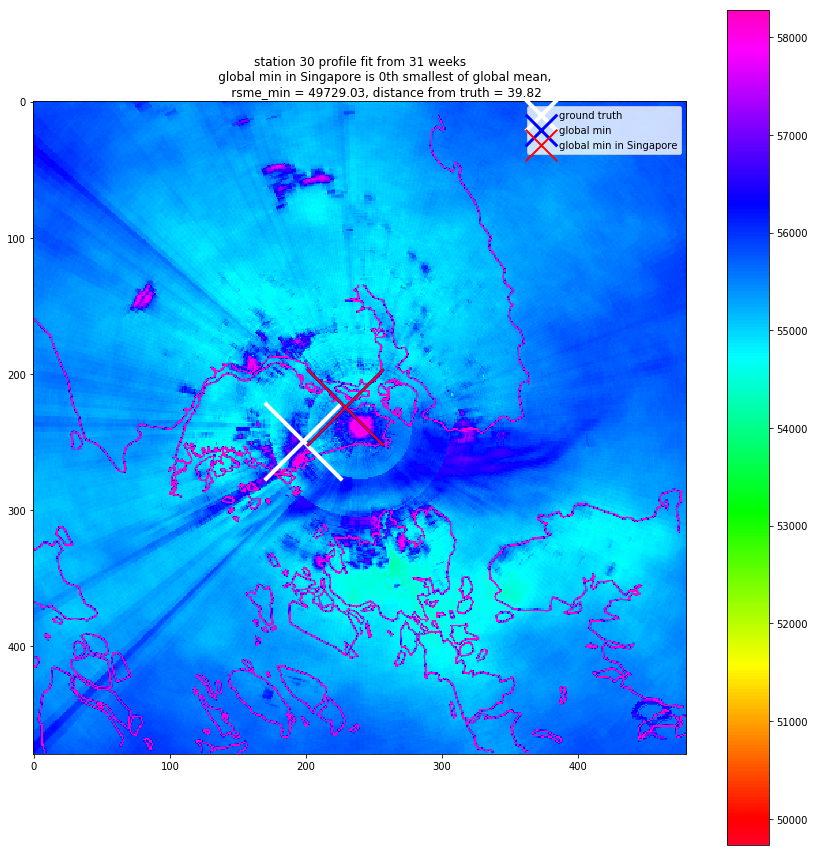

(30, 229, 224, 49729.034393779344, 39.824615503479755, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


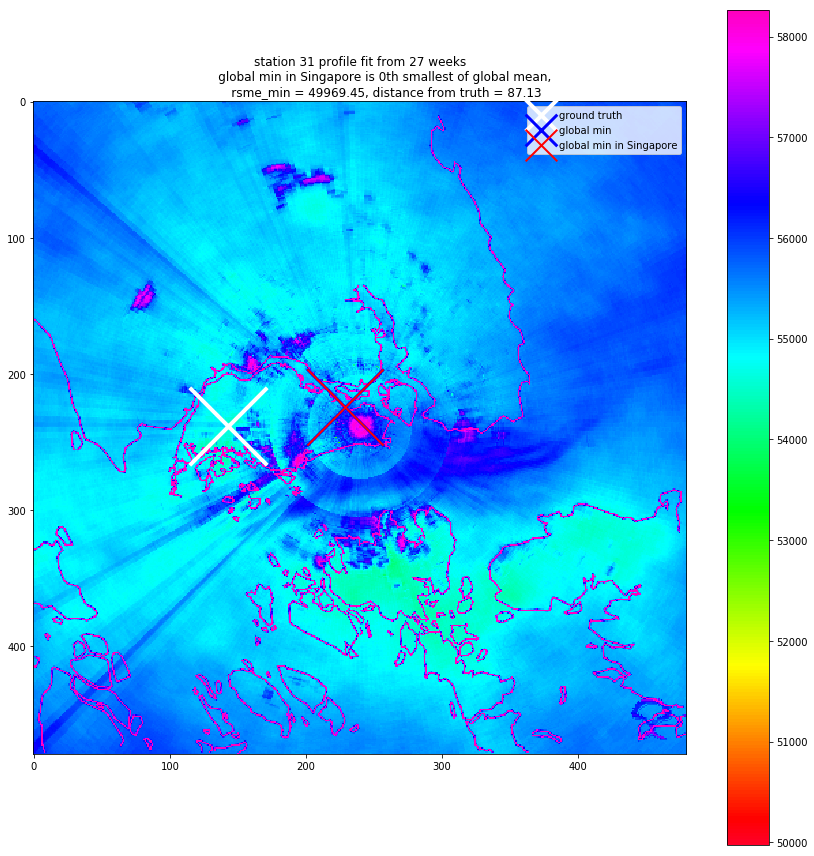

(31, 229, 224, 49969.45110545204, 87.13208364316786, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


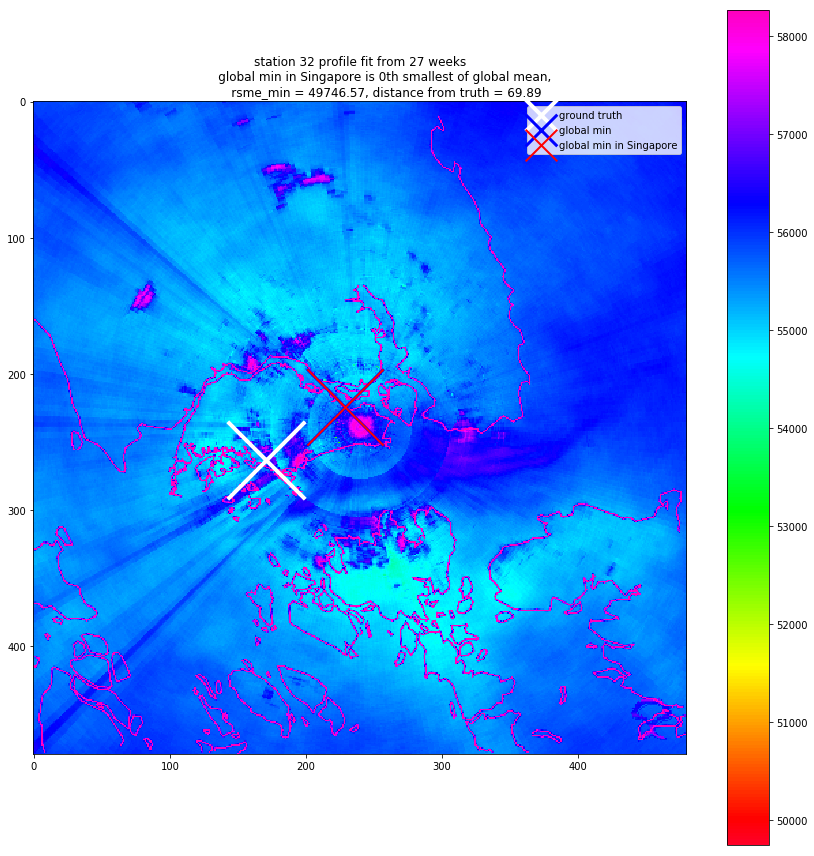

(32, 229, 224, 49746.570549690674, 69.8927750200262, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


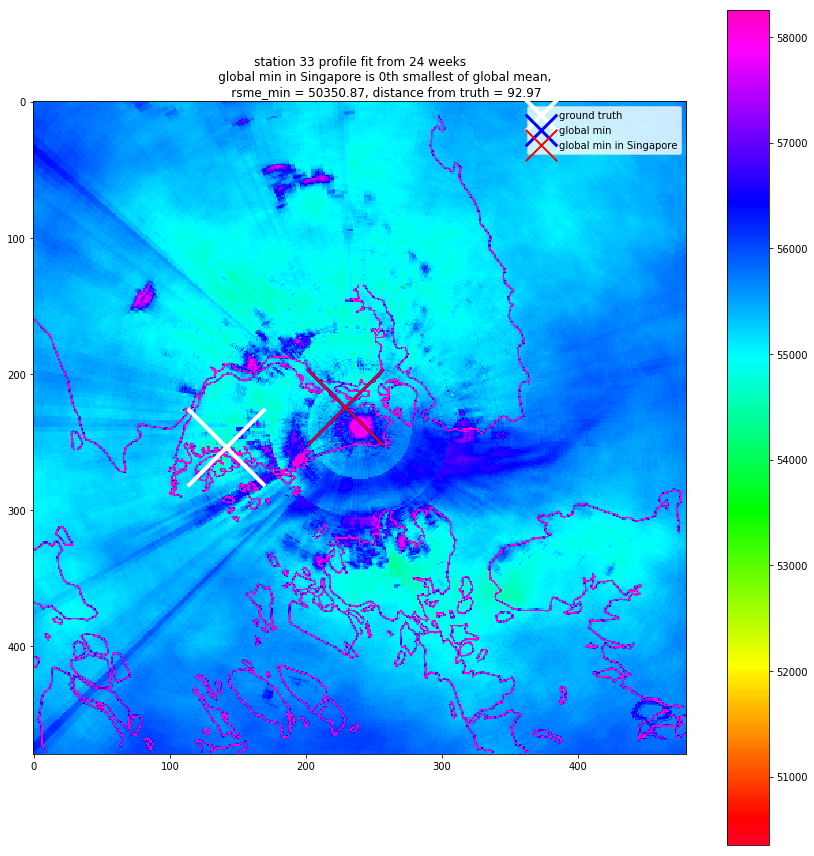

(33, 229, 224, 50350.87478496223, 92.97311439335567, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


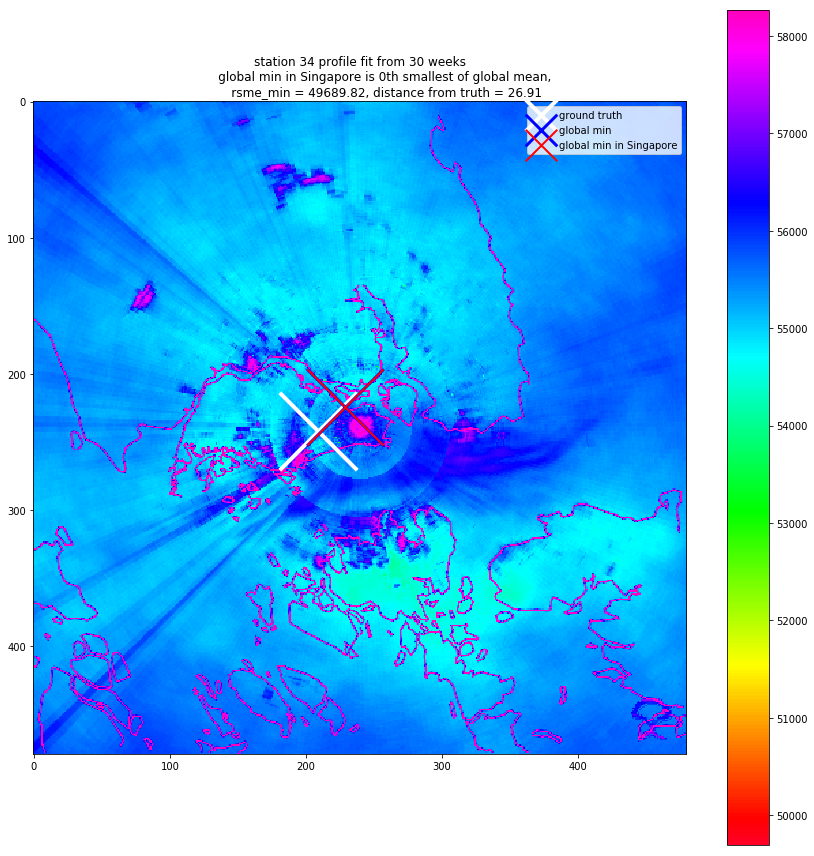

(34, 229, 224, 49689.81831178195, 26.90724809414742, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


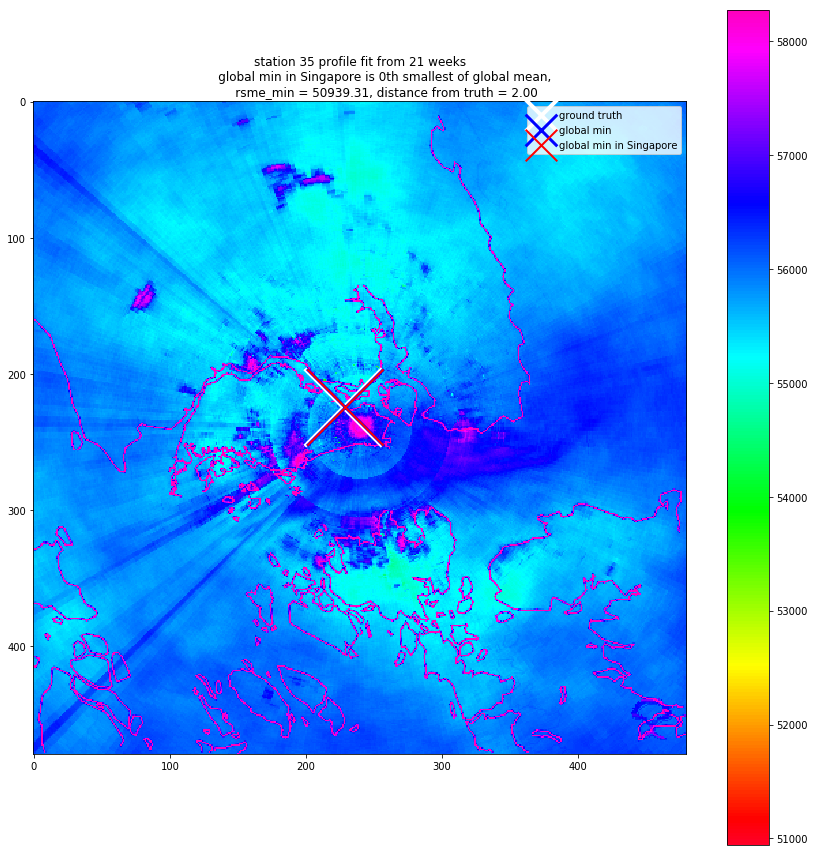

(35, 229, 224, 50939.30508743103, 2.0, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


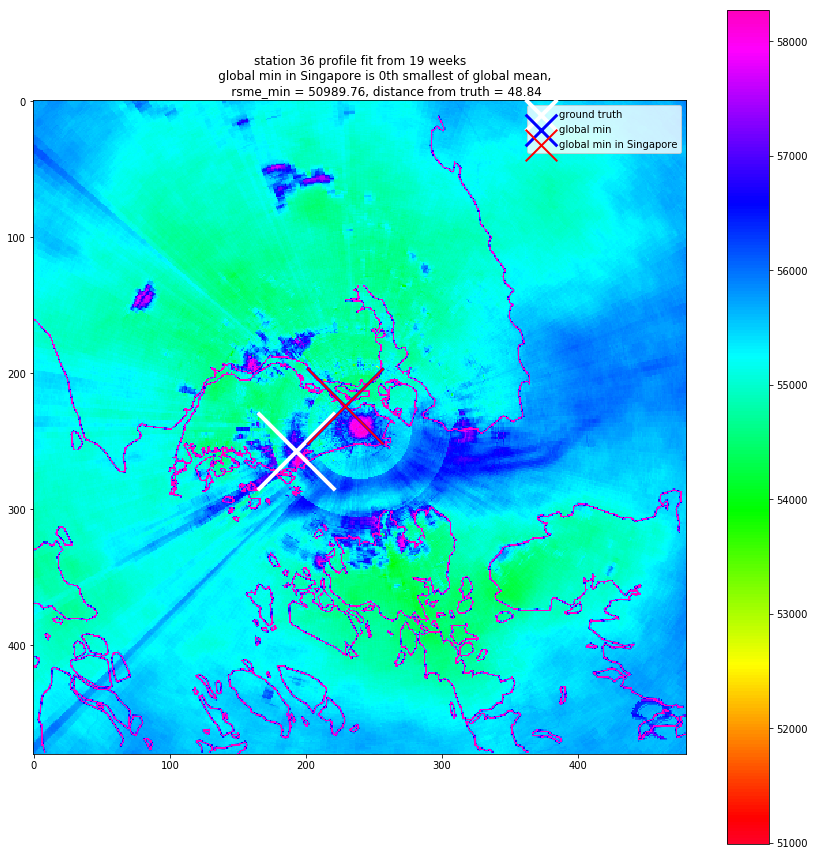

(36, 229, 224, 50989.762809389955, 48.83646178829912, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


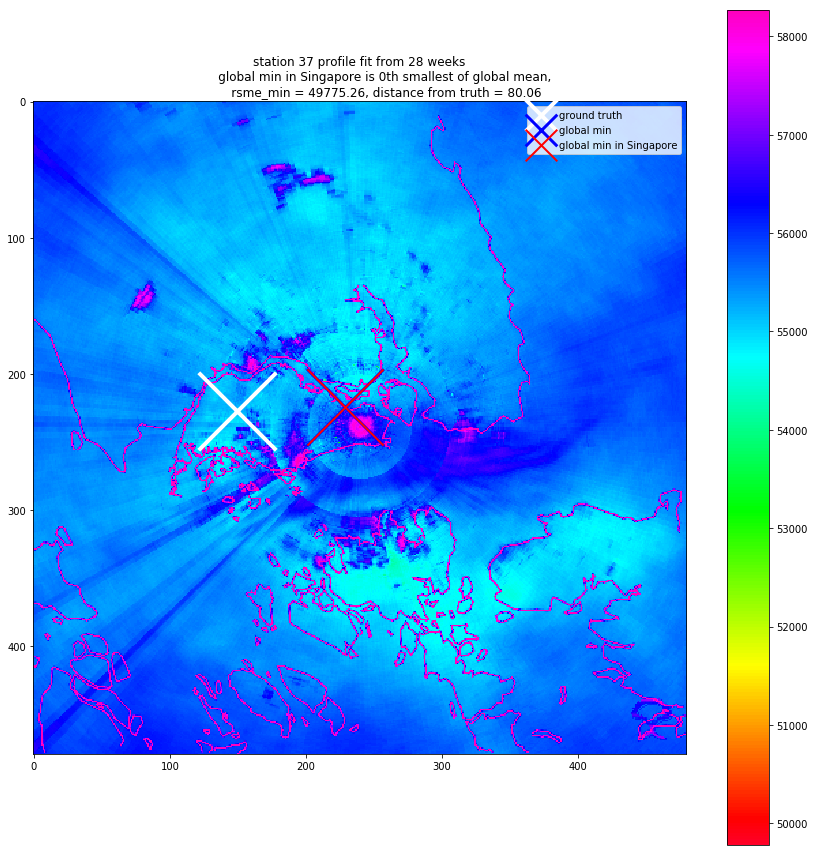

(37, 229, 224, 49775.26273891117, 80.05623023850174, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


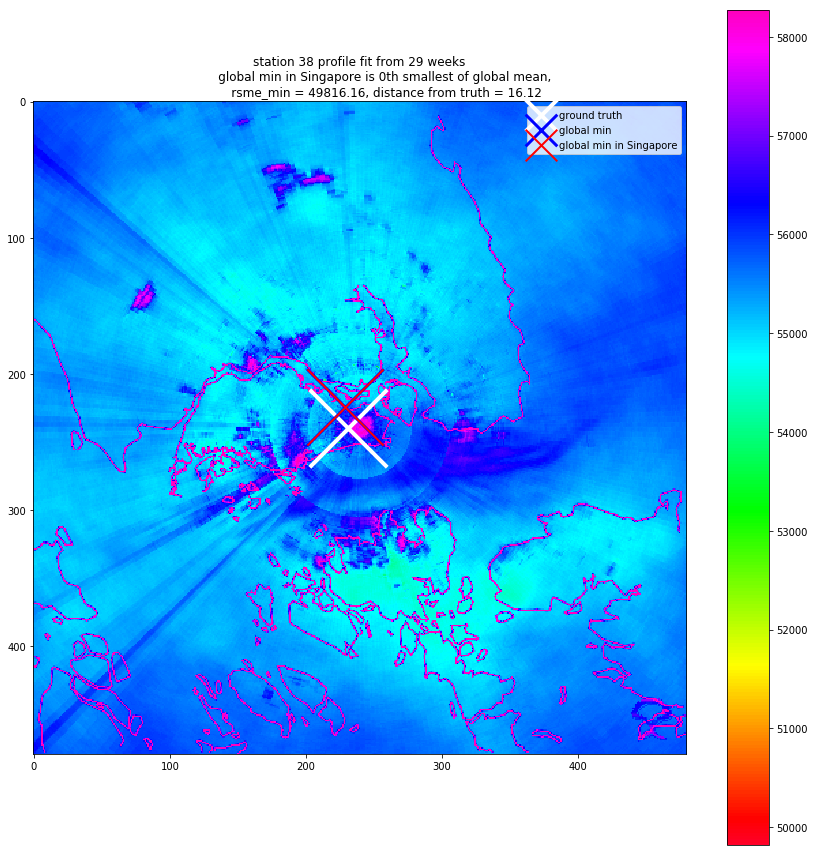

(38, 229, 224, 49816.16376804181, 16.1245154965971, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


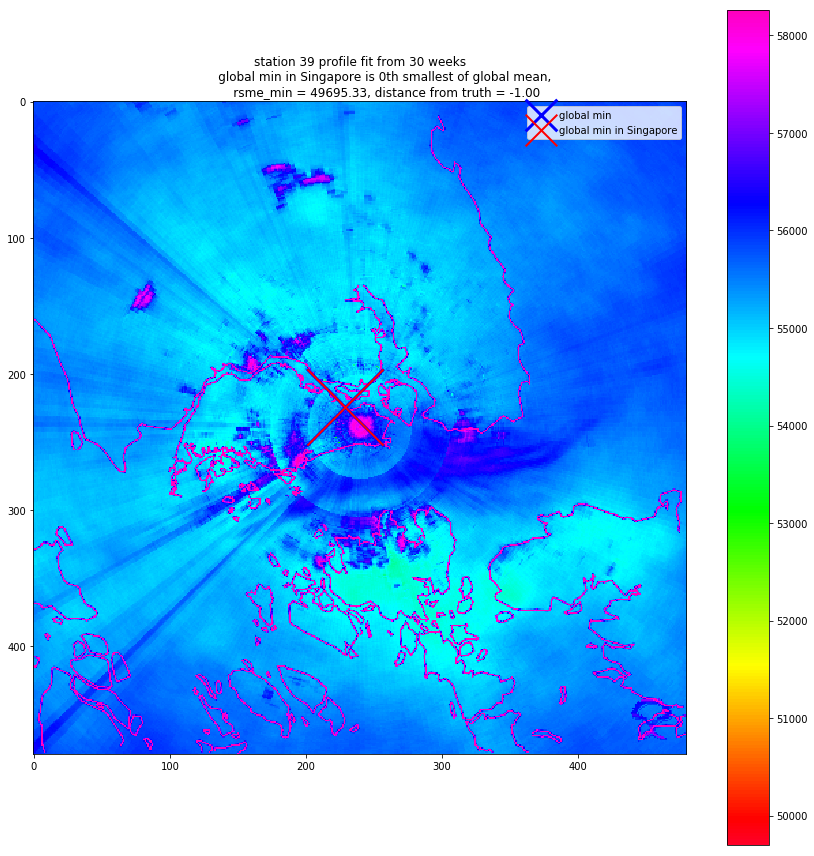

(39, 229, 224, 49695.327736190025, None, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


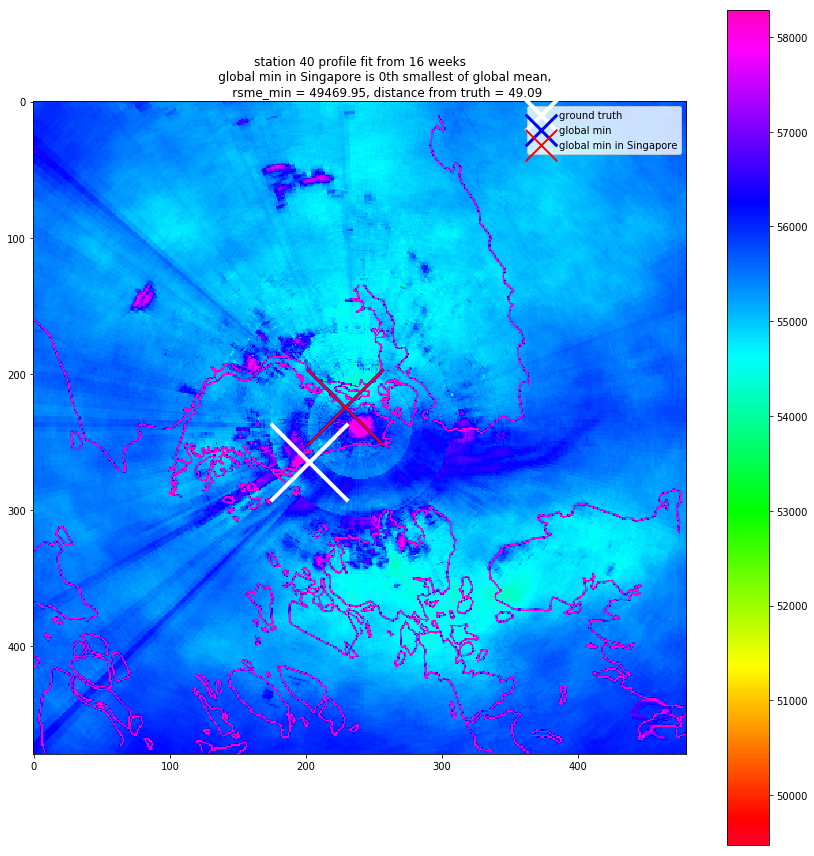

(40, 229, 224, 49469.951304886425, 49.09175083453431, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


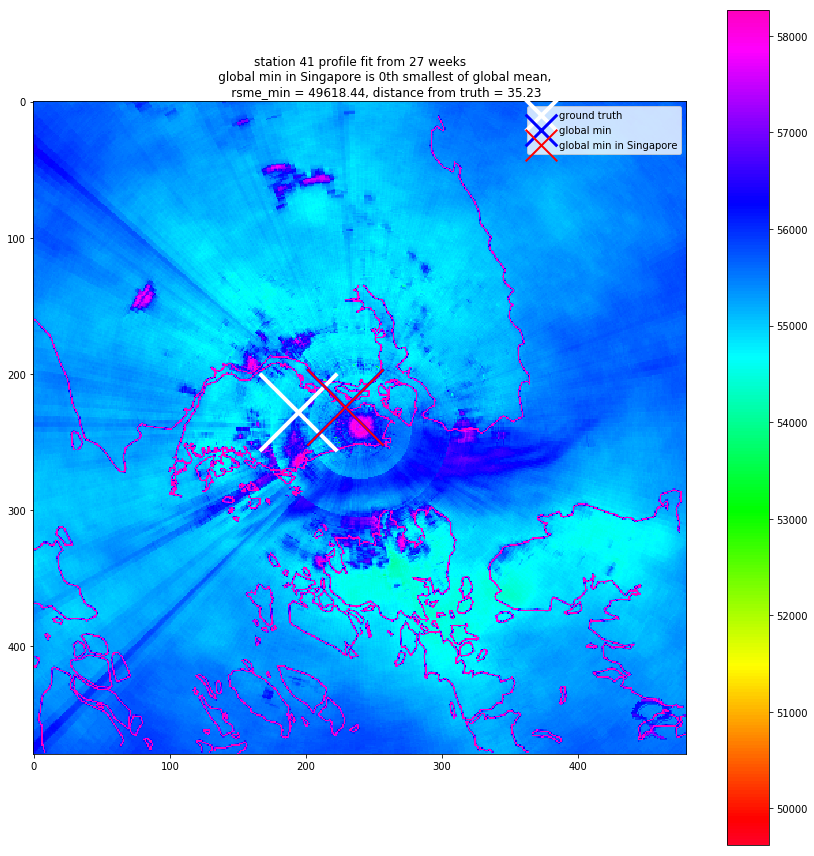

(41, 229, 224, 49618.44378321869, 35.22782990761707, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


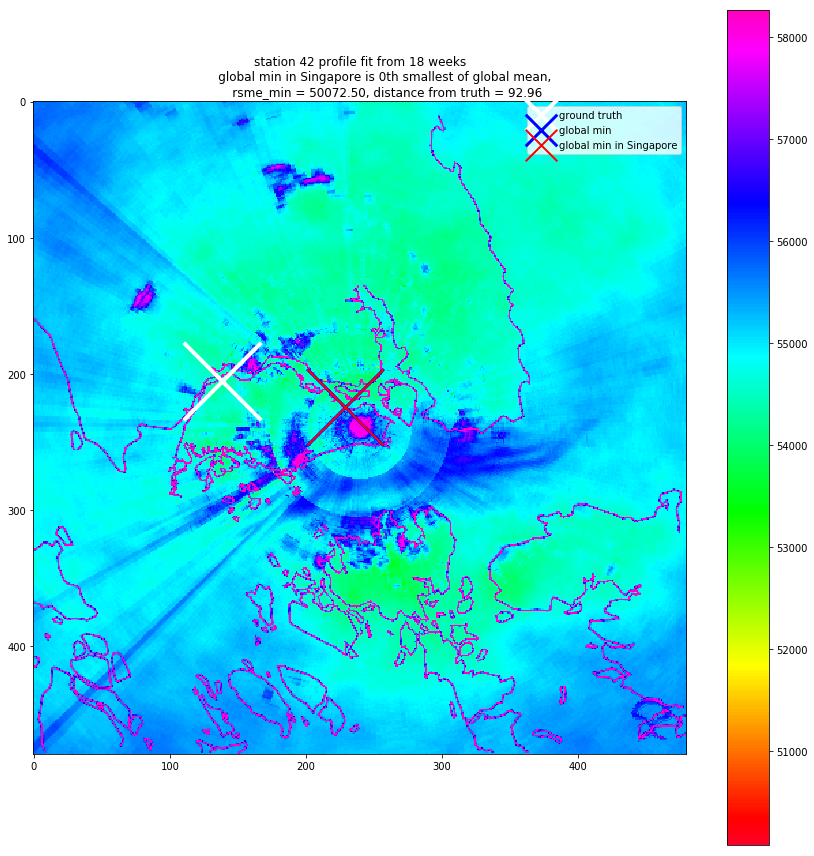

(42, 229, 224, 50072.502426726394, 92.9623579735368, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


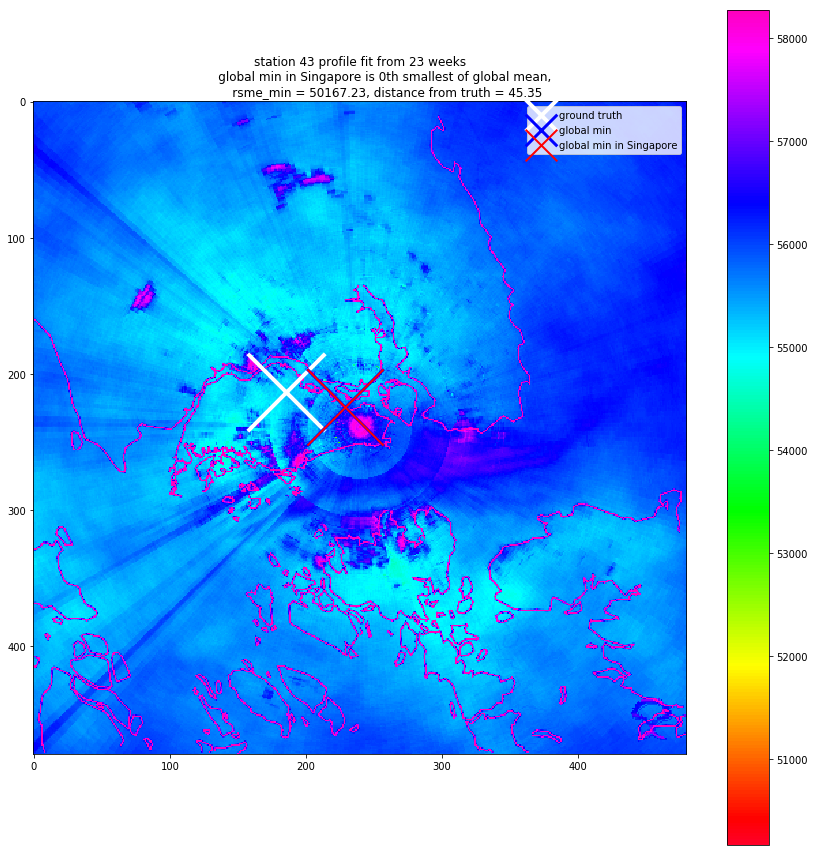

(43, 229, 224, 50167.23248851477, 45.35416188179427, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


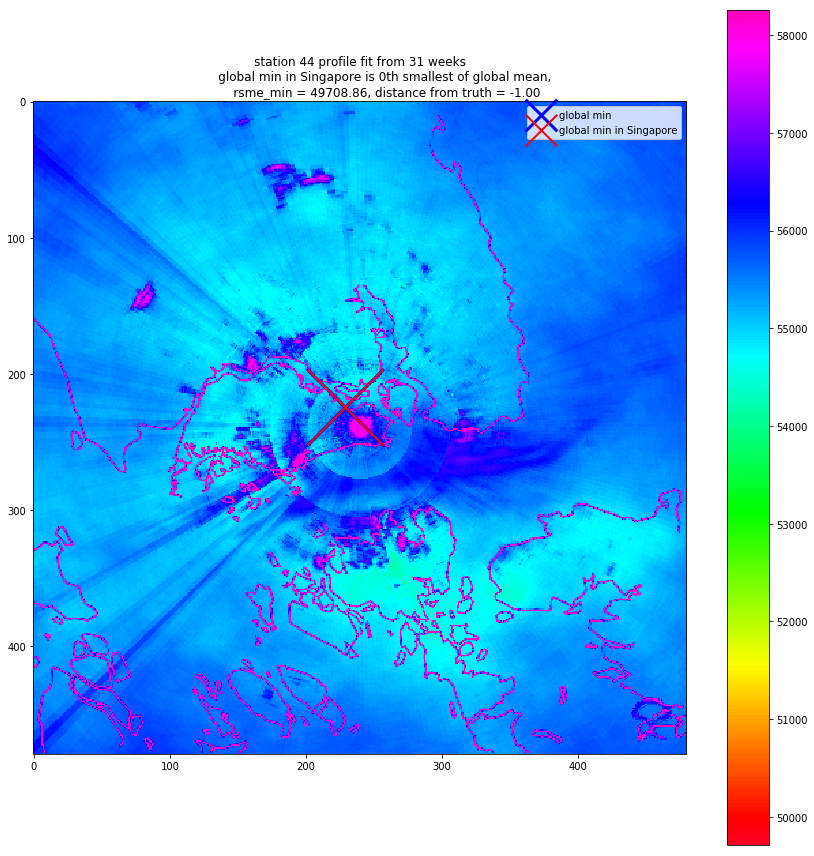

(44, 229, 224, 49708.85621878668, None, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


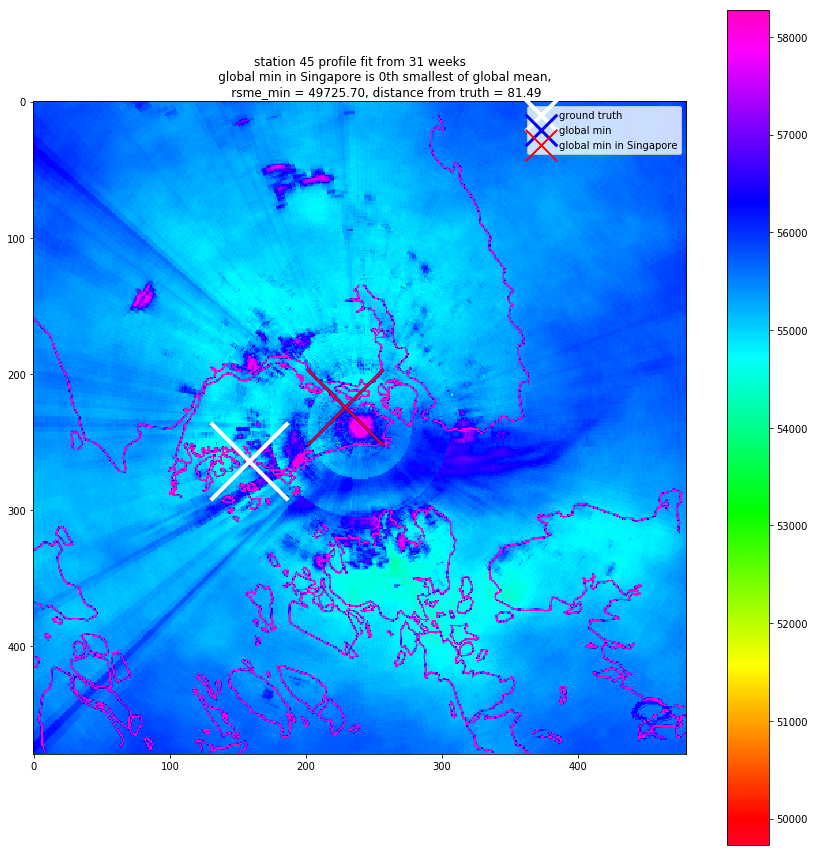

(45, 229, 224, 49725.703285631185, 81.49233092751734, 0, False)
107749
(229, 224)
107749
107749
(229, 224)
d


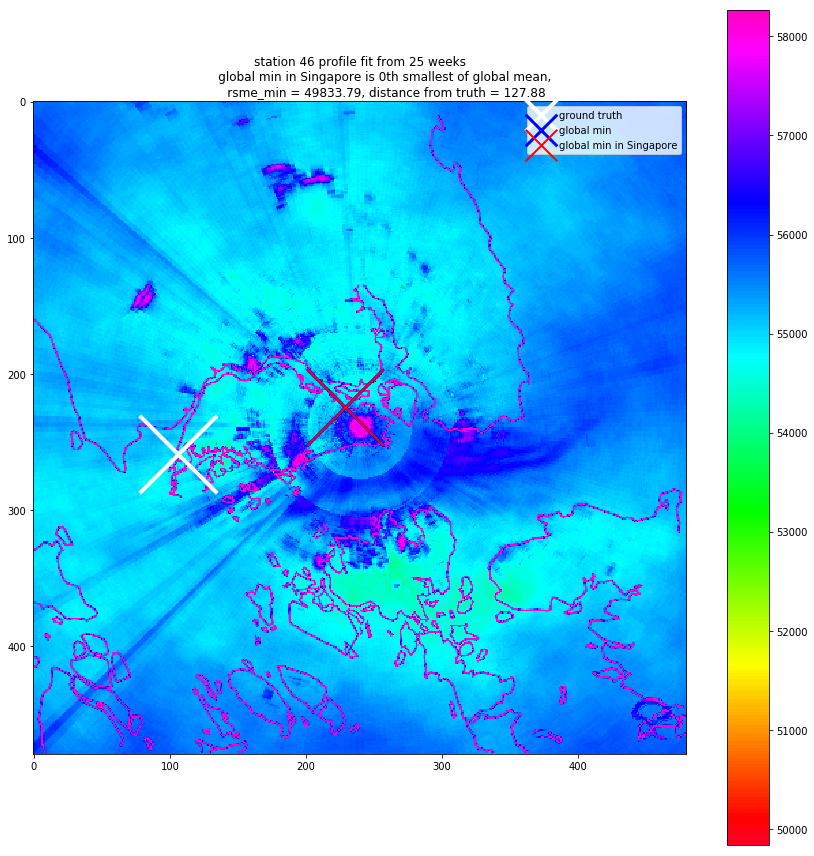

(46, 229, 224, 49833.788367537614, 127.88275880665071, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


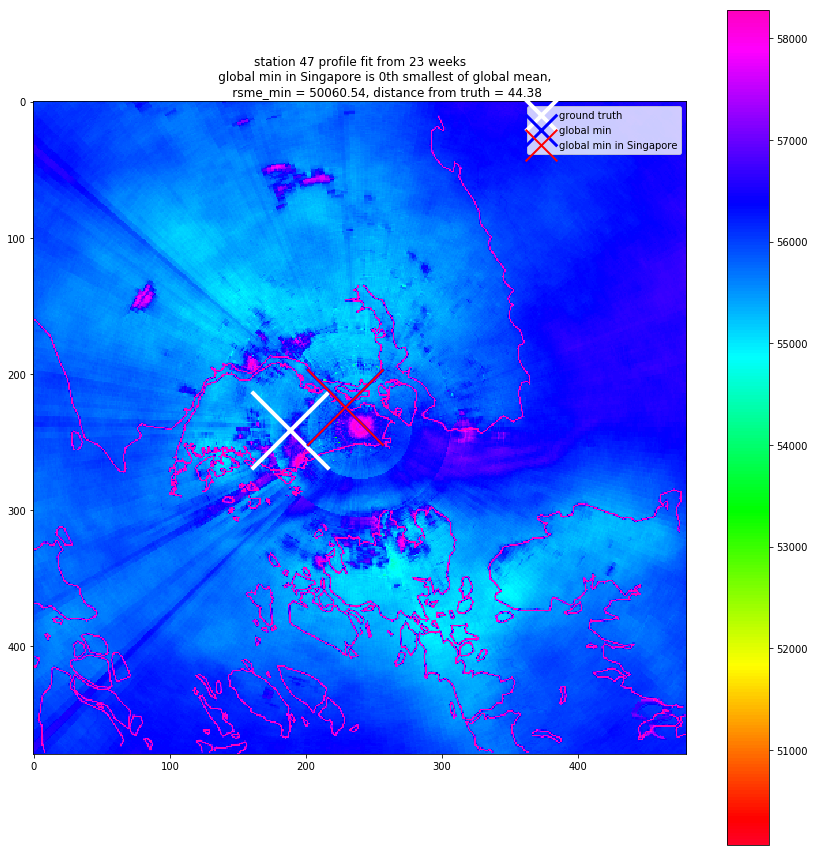

(47, 229, 224, 50060.5440441547, 44.384682042344295, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


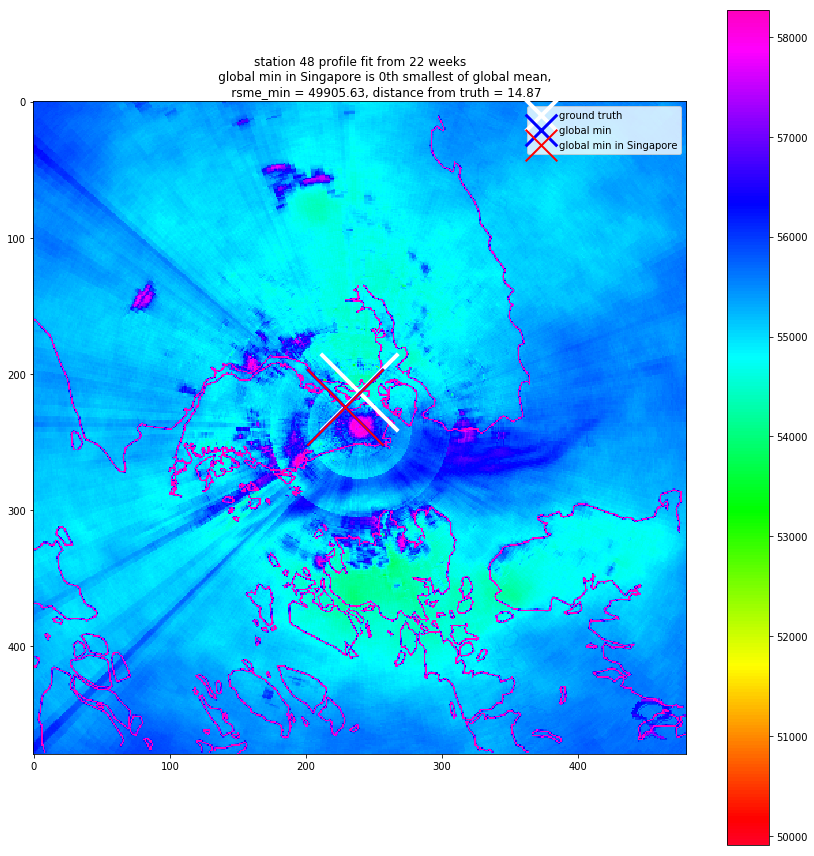

(48, 229, 224, 49905.634146050754, 14.866068747318506, 0, True)
107749
(229, 224)
107749
107749
(229, 224)
d


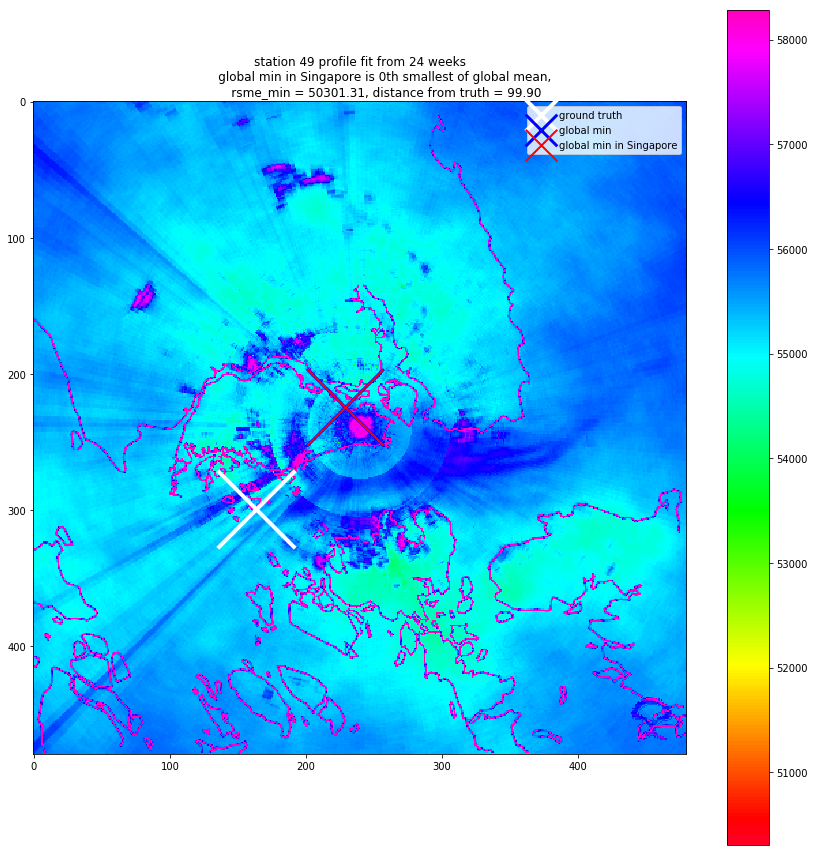

(49, 229, 224, 50301.30968860155, 99.90495483208028, 0, True)
station,x,y,least_rsme,dist_from_ground_truth,nth smallest
[0, 229, 224, 0]
[1, 229, 224, 0]
[2, 229, 224, 0]
[3, 229, 224, 0]
[4, 229, 224, 0]
[5, 229, 224, 0]
[6, 229, 224, 0]
[7, 229, 224, 0]
[8, 229, 224, 0]
[9, 229, 224, 0]
[10, 229, 224, 0]
[11, 229, 224, 0]
[12, 229, 224, 0]
[13, 229, 224, 0]
[14, 229, 224, 0]
[15, 229, 224, 0]
[16, 229, 224, 0]
[17, 229, 224, 0]
[18, 229, 224, 0]
[19, 229, 224, 0]
[20, 229, 224, 0]
[21, 229, 224, 0]
[23, 229, 224, 0]
[24, 229, 224, 0]
[25, 229, 224, 0]
[26, 229, 224, 0]
[27, 229, 224, 0]
[28, 229, 224, 0]
[29, 229, 224, 0]
[30, 229, 224, 0]
[31, 229, 224, 0]
[32, 229, 224, 0]
[33, 229, 224, 0]
[34, 229, 224, 0]
[35, 229, 224, 0]
[36, 229, 224, 0]
[37, 229, 224, 0]
[38, 229, 224, 0]
[39, 229, 224, 0]
[40, 229, 224, 0]
[41, 229, 224, 0]
[42, 229, 224, 0]
[43, 229, 224, 0]
[44, 229, 224, 0]
[45, 229, 224, 0]
[46, 229, 224, 0]
[47, 229, 224, 0]
[48, 229, 224, 0]
[49, 229, 224, 0]


In [17]:
import matplotlib.cm as cm

locations = []

for station in range(50):
    if station == 22:
        continue
    actual = np.array(gauge_df.loc[weeksint, str(station)])
    how_many_nan = np.count_nonzero(~np.isnan(actual))
    rmse = 1000000
    best = None
    
    plt.figure(figsize=(12,12))
    try:
        plt.scatter(stations_dict[station][0], stations_dict[station][1], s=6000,  linewidth='4',
                 marker='x', color="white", label="ground truth")
    except:
        pass
    temp = []
    a = np.add(radars,-1*np.array(actual))
    b = np.sqrt(np.nanmean(np.power(a,2),axis=1))
    argmin_ = np.argmin(b)
    print(argmin_)
    x_crds, y_crds = argmin_%480, argmin_//480
    plt.scatter(x_crds, y_crds, s=5900, marker='x', color="blue", label="global min",  linewidth='3')
    min_rmse = np.min(b)
    pos = 0
    
    print(x_crds, y_crds)
    x_crds___i, y_crds___i = x_crds, y_crds
    
    argmins_ = np.argpartition(b, range(500))
    print(argmins_)[0]
    for i in range(500):
        pos = i
        argmin_ = argmins_[i]
        min_rmse = b[argmin_]
        print(argmin_)
        x_crds___i, y_crds___i = argmin_%480, argmin_//480
        x_crds, y_crds = x_crds___i, y_crds___i
        print(x_crds___i, y_crds___i)
        if x_crds___i < 85 or x_crds___i > 299 or y_crds___i > 380 - (x_crds___i-85)*(380-270)/(299-85):
            print("e")
        elif x_crds___i < 119:
            if y_crds___i > 256 + (x_crds___i-85)*(205-256)/(119-85):
                print("a")
                break
        elif x_crds___i < 171:
            if y_crds___i > 205 + (x_crds___i-119)*(188-205)/(171-119):
                print("b")
                break
        elif x_crds___i < 226:
            if y_crds___i > 188 + (x_crds___i-171)*(205-188)/(226-171):
                print("c")
                break
        elif x_crds___i < 300:
            if y_crds___i > 205:
                print("d")
                break
        else:
            print("z")
            
        
#     print(radars.index()[argmin_])

#     for index, row in radars.iterrows():
#     #     if index[1] == 0 and index[0] % 50 == 0:
#     #         print(index)
#         pred = np.array(row[weeks])
        
#         temp_rmse = np.sqrt(np.nanmean(np.power((pred-actual),2)))
#         temp.append(temp_rmse)
#         if temp_rmse < rmse:
#             rmse = temp_rmse
#     #         print(rmse)
#             best = index
    try:
        distance_e = np.sqrt((x_crds___i-stations_dict[station][0])**2+(y_crds___i-stations_dict[station][1])**2)
        distance_e_ = distance_e
    except:
        distance_e = None
        distance_e_ = -1
    plt.title('''station {} profile fit from {} weeks
              global min in Singapore is {}th smallest of global mean, 
              rsme_min = {:.2f}, distance from truth = {:.2f}'''.format(station, how_many_nan, pos, min_rmse, distance_e_))
    plt.imshow([b[480*i:480*(i+1)] for i in range(480)],cmap=cm.gist_rainbow
#                ,vmin=20, vmax=80
              )
    plt.colorbar()
    plt.scatter(x_crds, y_crds, s=5800, marker='x', color="red", label="global min in Singapore",  linewidth='2')
    lgnd = plt.legend(loc="upper right")
    for handle in lgnd.legendHandles:
        handle.set_sizes([1000])
    plt.tight_layout()
    plt.savefig("img/station_b{:02d}".format(station))
    plt.show()
    locations.append([station, x_crds, y_crds, pos])
    print(station, x_crds, y_crds, min_rmse, distance_e, pos, np.isnan(actual).any())

print("station,x,y,least_rsme,dist_from_ground_truth,nth smallest")    
for location in locations:
    print(location)

In [26]:
# plt.plot(station0, label='actual')
# plt.plot(radars.loc[249, 217], label='pred')
# plt.legend(['actual', 'pred'])

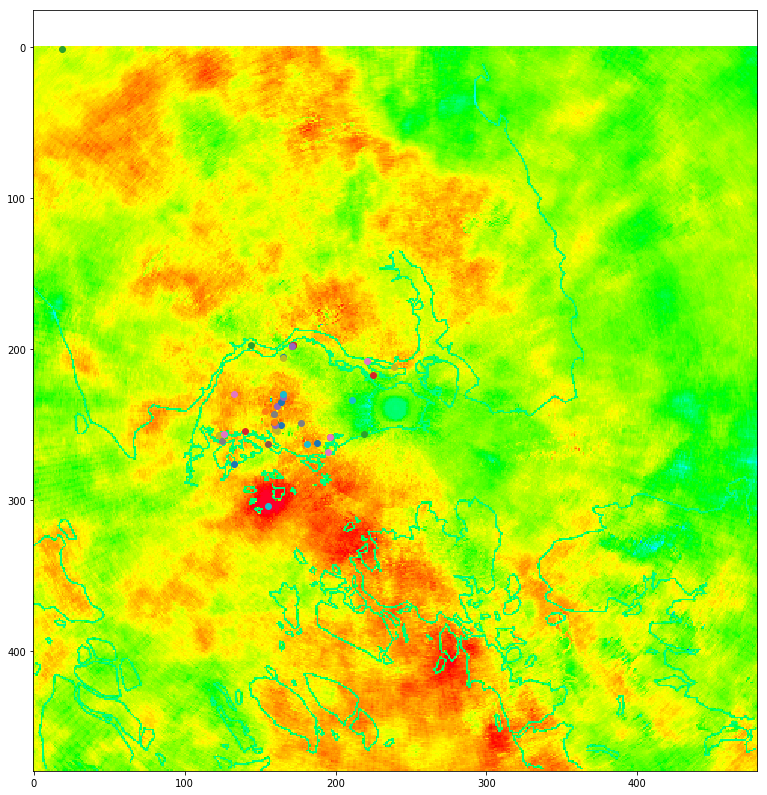

In [14]:
locations = [[0, 165, 205, 2],
[1, 123, 257, 0],
[2, 219, 256, 0],
[3, 225, 217, 0],
[4, 160, 249, 2],
[5, 159, 249, 0],
[6, 221, 208, 0],
[7, 171, 198, 0],
[8, 123, 257, 0],
[9, 181, 263, 0],
[10, 133, 276, 0],
[11, 159, 243, 0],
[12, 172, 197, 0],
[13, 196, 258, 0],
[14, 161, 238, 0],
[15, 159, 249, 0],
[16, 195, 268, 0],
[17, 171, 198, 0],
[18, 161, 254, 0],
[19, 165, 232, 0],
[20, 164, 235, 0],
[21, 165, 230, 0],
[22, 19, 1, 499],
[23, 172, 197, 0],
[24, 165, 232, 0],
[25, 160, 253, 0],
[26, 133, 230, 0],
[27, 159, 243, 0],
[28, 160, 253, 0],
[29, 211, 234, 60],
[30, 164, 250, 0],
[31, 153, 241, 0],
[32, 160, 249, 0],
[33, 140, 254, 0],
[34, 160, 250, 1],
[35, 172, 197, 0],
[36, 196, 258, 0],
[37, 125, 261, 0],
[38, 165, 206, 6],
[39, 165, 230, 0],
[40, 188, 262, 0],
[41, 159, 248, 0],
[42, 144, 197, 4],
[43, 172, 197, 1],
[44, 171, 198, 0],
[45, 155, 263, 0],
[46, 126, 256, 0],
[47, 177, 249, 0],
[48, 239, 212, 0],
[49, 155, 304, 0]]

plt.figure(figsize=(14,14))
plt.imshow([b[480*i:480*(i+1)] for i in range(480)],cmap=cm.gist_rainbow
               ,vmin=20, vmax=80
              )
for location in locations:
    plt.scatter(location[1], location[2])
plt.show()